<a href="https://colab.research.google.com/github/gperbone/clustering/blob/main/customer_personality_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Consumer Analysis and Clustering

- Goal: use available data from customers in a market network to cluster them and suggest business strategies.
- Dataset: [Customer Personality Analysis](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis/data) available on Kaggle.

In [759]:
import zipfile

with zipfile.ZipFile('/content/customer_personality_analysis.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/')

In [760]:
pip install dataprep

In [761]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, make_scorer
from sklearn.neighbors import NearestNeighbors

from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster.elbow import kelbow_visualizer

import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram

from dataprep.eda import plot, plot_correlation, create_report, plot_missing

pd.set_option('display.max_columns', 50)

In [762]:
df = pd.read_csv('marketing_campaign.csv', sep='\t')
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [763]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

- The dataset conatins 2.240 rows and 29 columns (features).

- Based on the info available on [Kaggle](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis), we have the following:
  - **People**
    - ID: Customer's unique identifier
    - Year_Birth: Customer's birth year
    - Education: Customer's education level
    - Marital_Status: Customer's marital status
    - Income: Customer's yearly household income
    - Kidhome: Number of children in customer's household
    - Teenhome: Number of teenagers in customer's household
    - Dt_Customer: Date of customer's enrollment with the company
    - Recency: Number of days since customer's last purchase
    - Complain: 1 if the customer complained in the last 2 years, 0 otherwise

  - **Products**
    - MntWines: Amount spent on wine in the last 2 years
    - MntFruits: Amount spent on fruits in the last 2 years
    - MntMeatProducts: Amount spent on meat in the last 2 years
    - MntFishProducts: Amount spent on fish in the last 2 years
    - MntSweetProducts: Amount spent on sweets in the last 2 years
    - MntGoldProds: Amount spent on gold in the last 2 years

  - **Promotion**
    - NumDealsPurchases: Number of purchases made with a discount
    - AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
    - AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
    - AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
    - AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
    - AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
    - Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

  - **Place**
    - NumWebPurchases: Number of purchases made through the company’s website
    - NumCatalogPurchases: Number of purchases made using a catalogue
    - NumStorePurchases: Number of purchases made directly in stores
    - NumWebVisitsMonth: Number of visits to the company’s website in the last month

- We can make use of dataprep library to quickly plot these features:



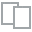
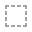
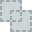
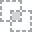
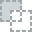
...
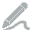
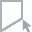
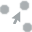
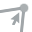
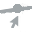

In [764]:
plot(df)

Since there are a lot of features, we will make use of the division stated in the description of the dataset to analyze the data in parts.

#People

In [765]:
people_columns = ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income',
                  'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'Complain']
people_df = df[people_columns]

In [766]:
people_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID              2240 non-null   int64  
 1   Year_Birth      2240 non-null   int64  
 2   Education       2240 non-null   object 
 3   Marital_Status  2240 non-null   object 
 4   Income          2216 non-null   float64
 5   Kidhome         2240 non-null   int64  
 6   Teenhome        2240 non-null   int64  
 7   Dt_Customer     2240 non-null   object 
 8   Recency         2240 non-null   int64  
 9   Complain        2240 non-null   int64  
dtypes: float64(1), int64(6), object(3)
memory usage: 175.1+ KB


In [767]:
print(f"Porcentagem de valores nulos: {(people_df['Income'].isna().sum() / people_df['Income'].count()) * 100}%")

Porcentagem de valores nulos: 1.083032490974729%


There are null values in the *Income* columns. These, however, represent only a small fraction and will be dropped.

Also, the column *Dt_Customer* is in the object format and needs to be transformed to datetime.

In [768]:
people_df = people_df.dropna()
people_df["Dt_Customer"] = pd.to_datetime(people_df["Dt_Customer"], format="%d-%m-%Y")

Ok, we are ready to plot our features.

In [769]:
def plot_features(df, feature, numerical=None):
  if numerical != False and pd.api.types.is_numeric_dtype(df[feature].dtype): #numerical feature
    fig, axes = plt.subplots(1,2, figsize=(12,8))

    sns.boxplot(data=df, y=feature, color='green', ax=axes[0])
    plt.ylabel(feature)
    sns.histplot(data=df, y=feature, color='blue', ax=axes[1], stat='density', kde=True)
    plt.ylabel(None)
    plt.show()

  else: #categorical
    fig, ax = plt.subplots(figsize=(12,8))
    sns.countplot(data=df, x=feature, ax=ax)
    for p in ax.patches:
        ax.annotate(f'\n{p.get_height()}',
                   (p.get_x()+0.4, p.get_height()+5),
                   ha = "center", color = "black")
    plt.xlabel("\n" + feature)
    plt.ylabel("Number of Clients")
    plt.show()


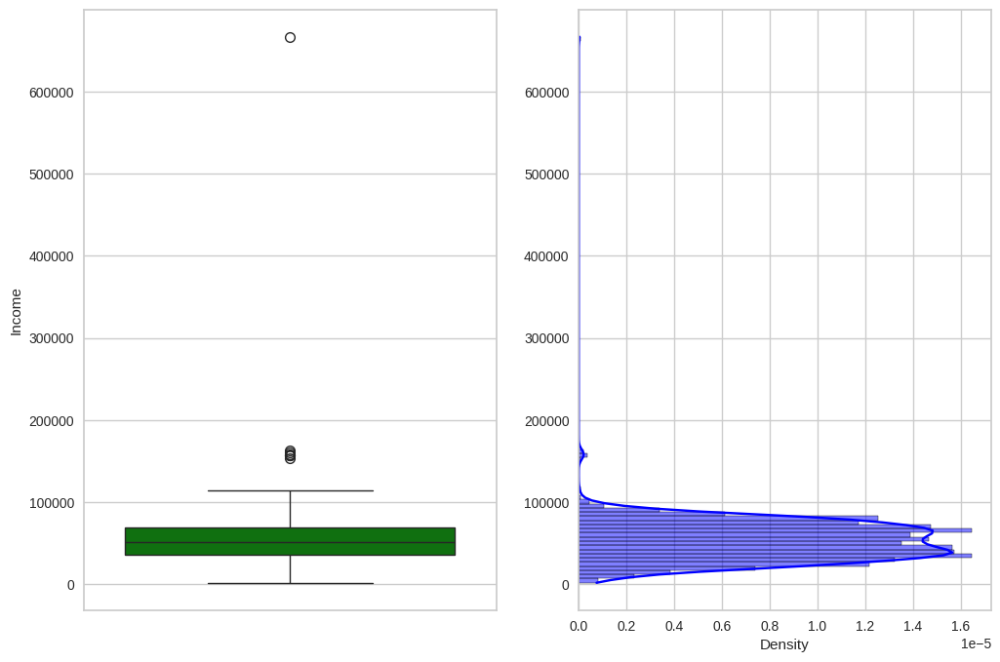

In [770]:
plot_features(people_df, 'Income')

<ipython-input-771-18a698f7b7e5>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  people_df = people_df[df.Income<200000]


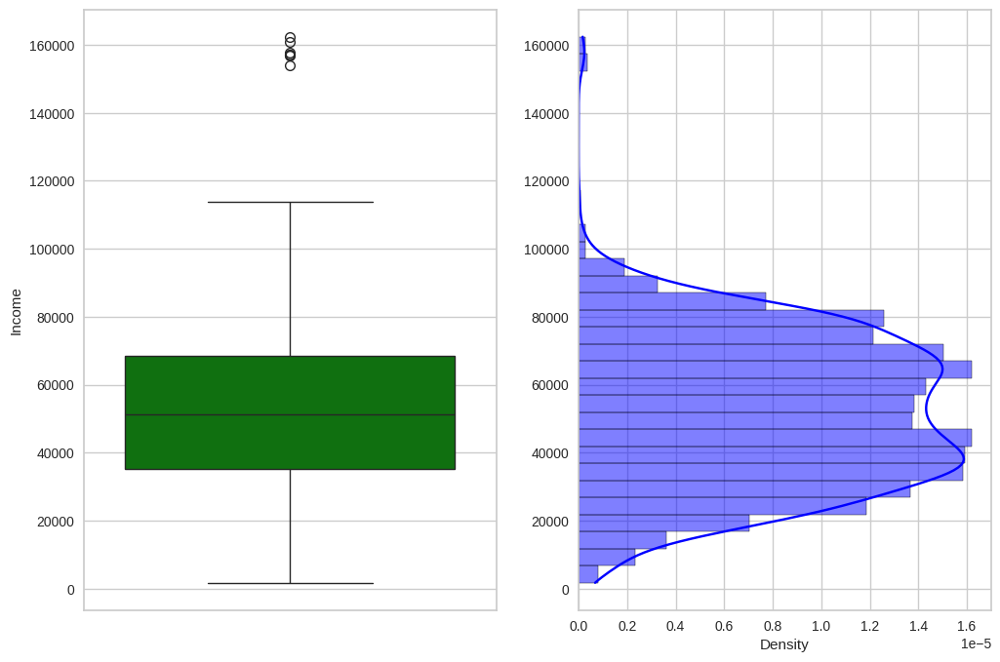

In [771]:
people_df = people_df[df.Income<200000]

plot_features(people_df, 'Income')

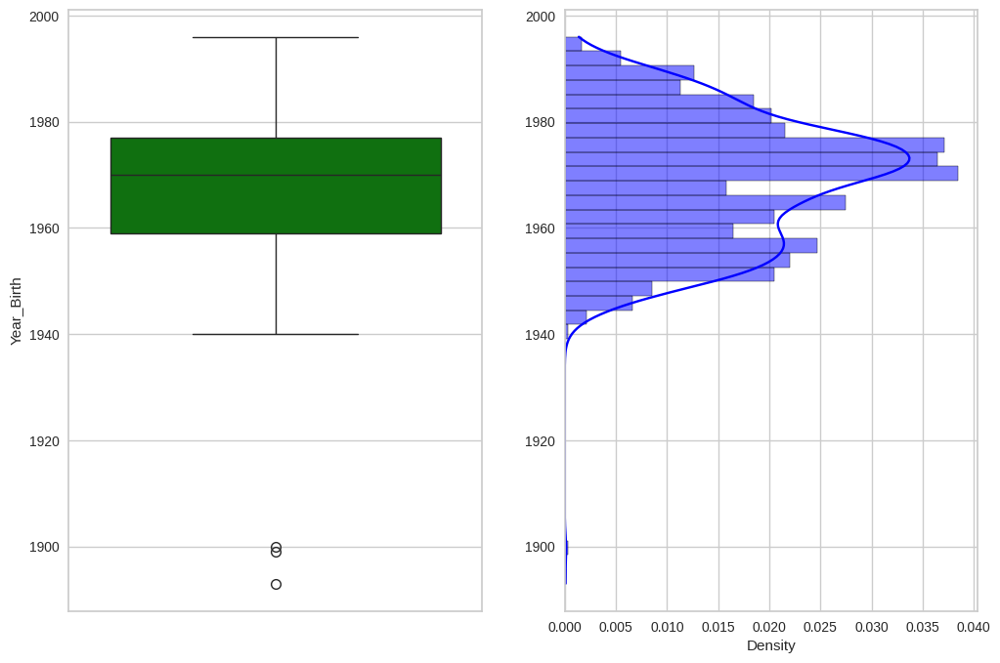

In [772]:
plot_features(people_df, 'Year_Birth')

We clearly got some outliers, but we will turn this feature into *Age* and then check it again (using the most recent customer registration date as the reference date for today).

In [773]:
people_df['Age'] = people_df.Dt_Customer.max().year - people_df.Year_Birth
people_df = people_df.drop(['Year_Birth'], axis=1)


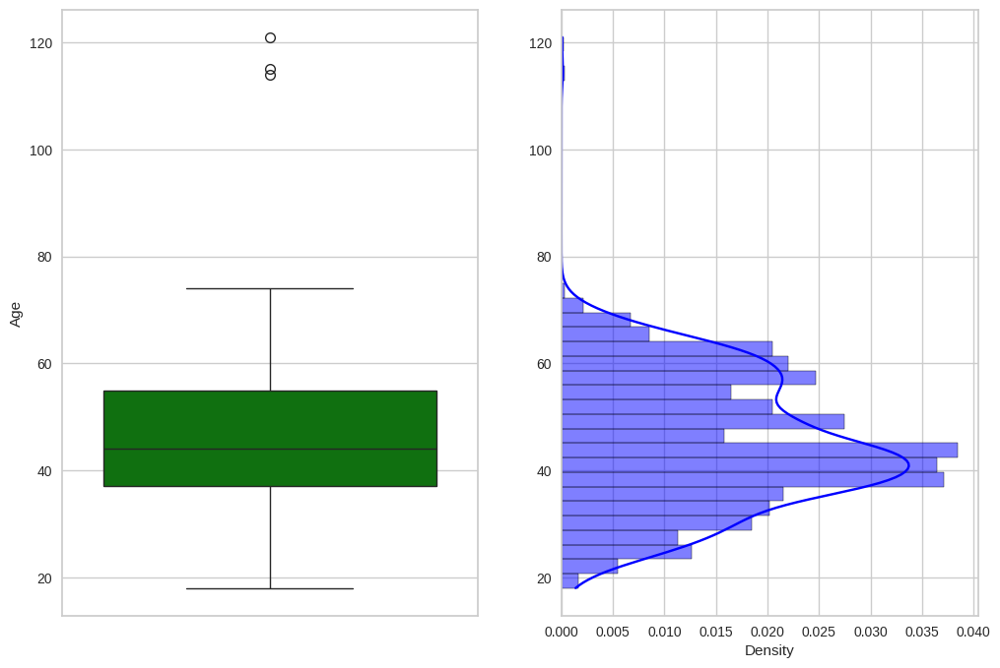

In [774]:
plot_features(people_df, 'Age')

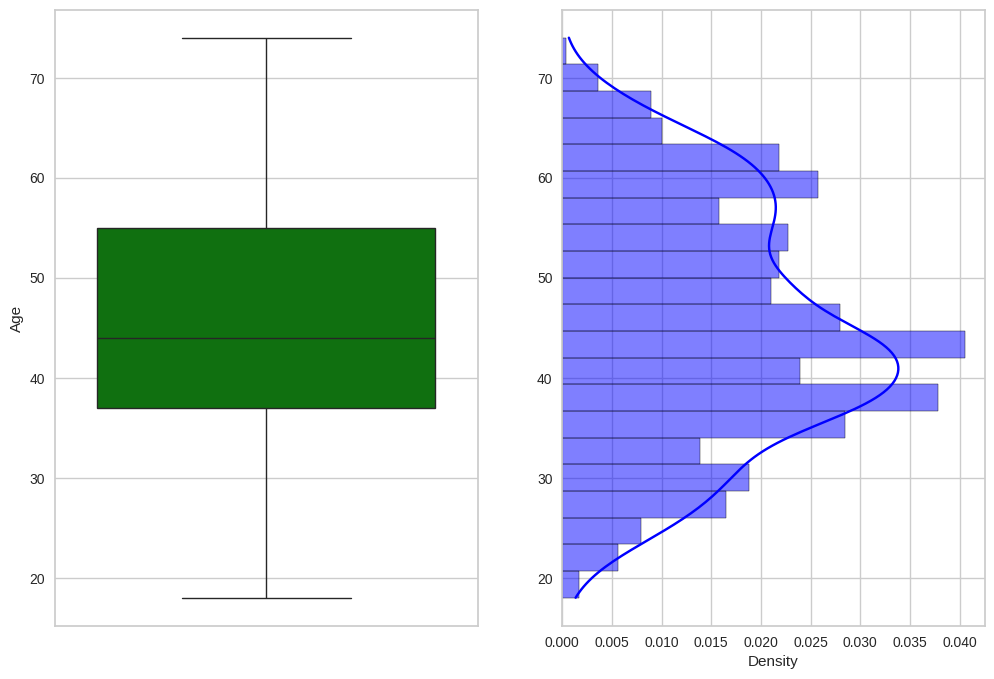

In [775]:
people_df = people_df[people_df['Age'] < 80]

plot_features(people_df, 'Age')

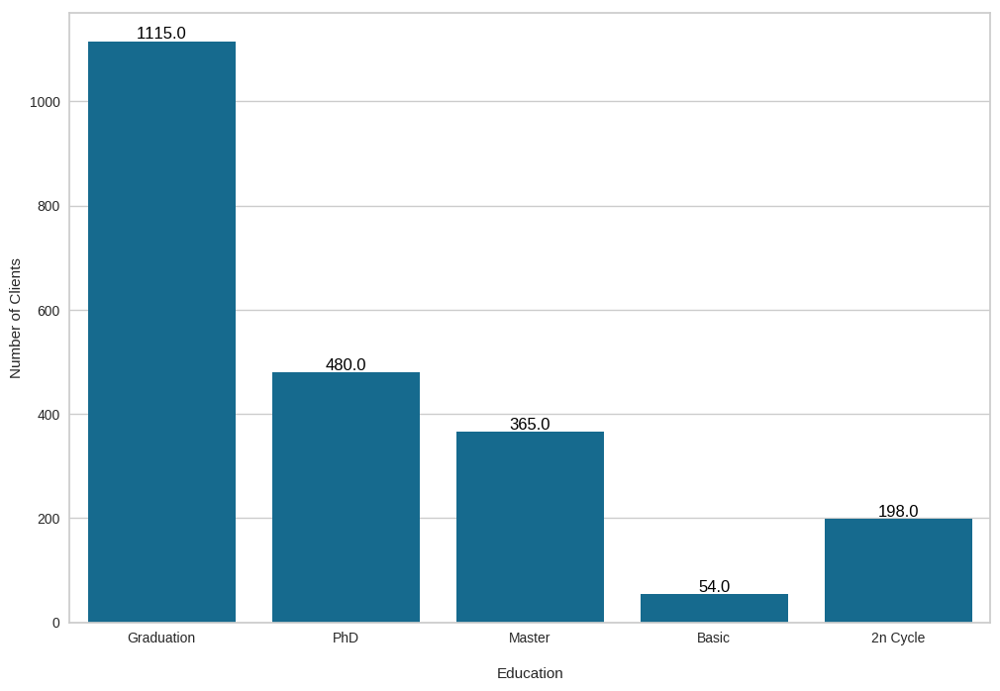

In [776]:
plot_features(people_df, 'Education')

To go through the model, this would have to be encoded. We can use LabelEncoder, OneHotEnconder or do it by hand, which is what I will do:

In [777]:
people_df['Education'] = people_df['Education'].replace({'Basic':0,'2n Cycle':1,'Graduation':2,'Master':3,'PhD':4})

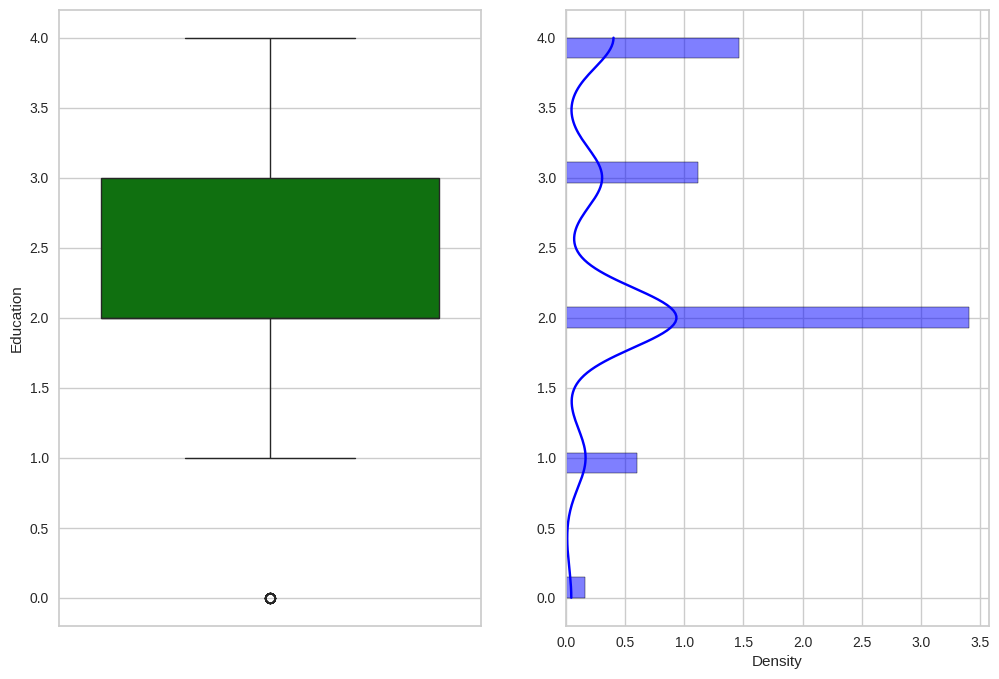

In [778]:
plot_features(people_df, 'Education')

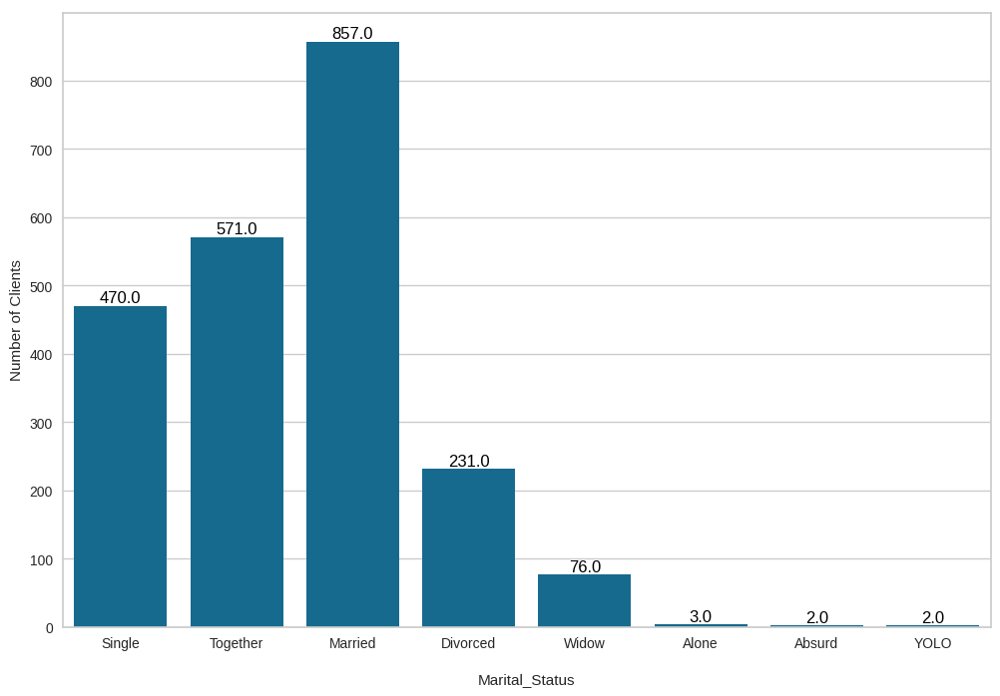

In [779]:
plot_features(people_df, 'Marital_Status')

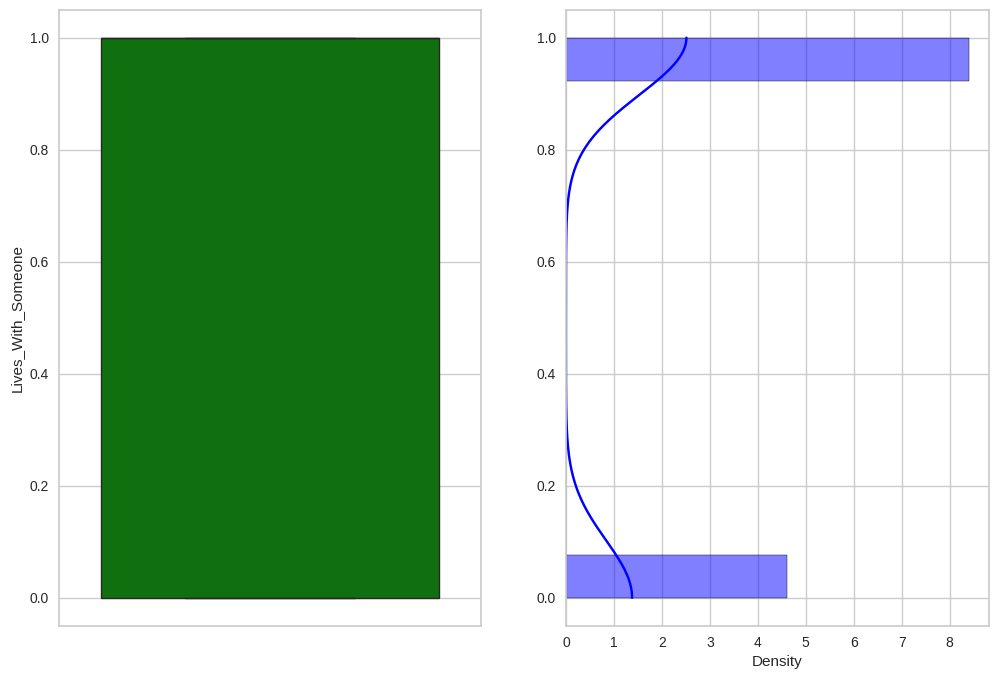

In [780]:
people_df['Marital_Status'] = people_df['Marital_Status'].replace({'Alone':'Single','Absurd':'Single','YOLO':'Single'})
people_df['Lives_With_Someone'] = people_df['Marital_Status'].replace({'Single':0, 'Together':1, 'Married':1, 'Divorced':0, 'Widow':0})

plot_features(people_df, 'Lives_With_Someone')

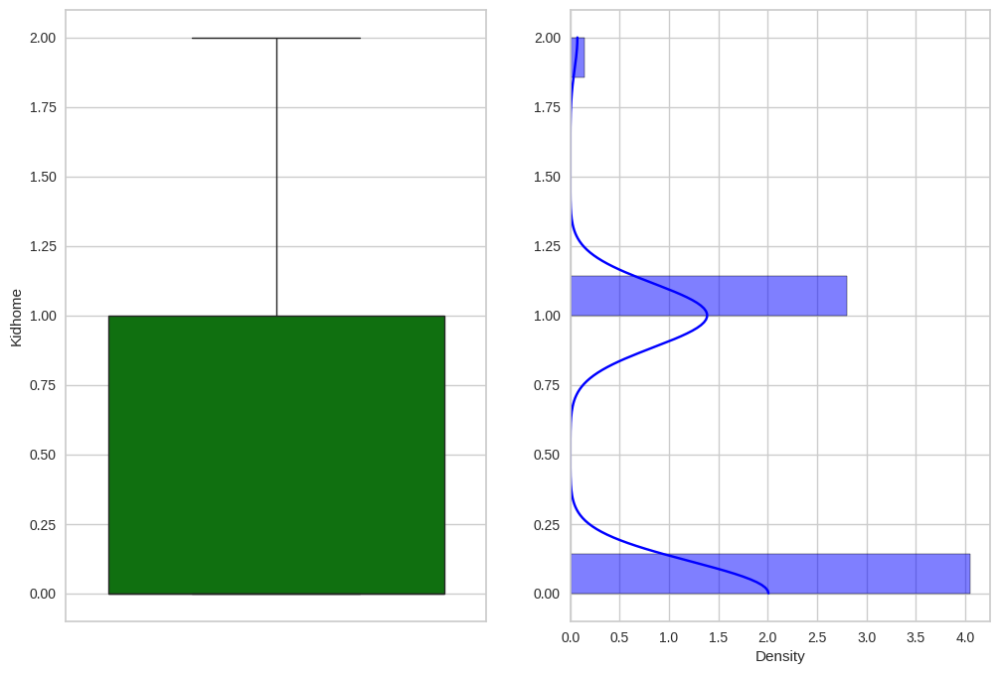

In [781]:
plot_features(people_df, 'Kidhome')

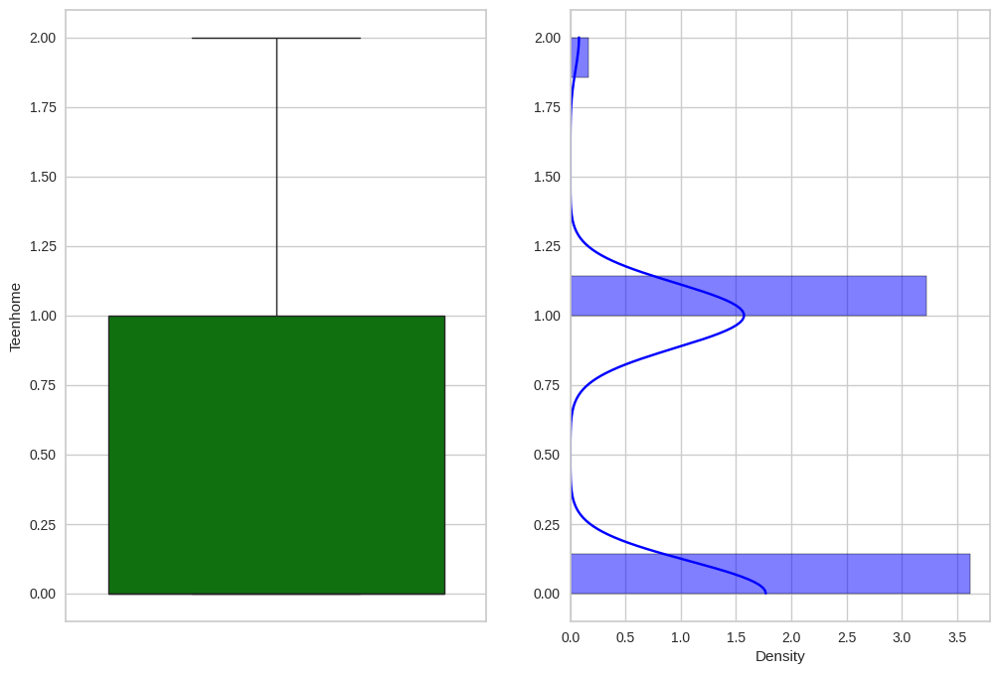

In [782]:
plot_features(people_df, 'Teenhome')

In [783]:
people_df['Dt_Customer'].describe()

<ipython-input-783-ae8359e13536>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  people_df['Dt_Customer'].describe()


count                    2212
unique                    662
top       2012-08-31 00:00:00
freq                       12
first     2012-07-30 00:00:00
last      2014-06-29 00:00:00
Name: Dt_Customer, dtype: object

In [784]:
# Let´s turn this to numeric data:
people_df['Dt_Customer'] = (people_df.Dt_Customer.max()-people_df.Dt_Customer).dt.days

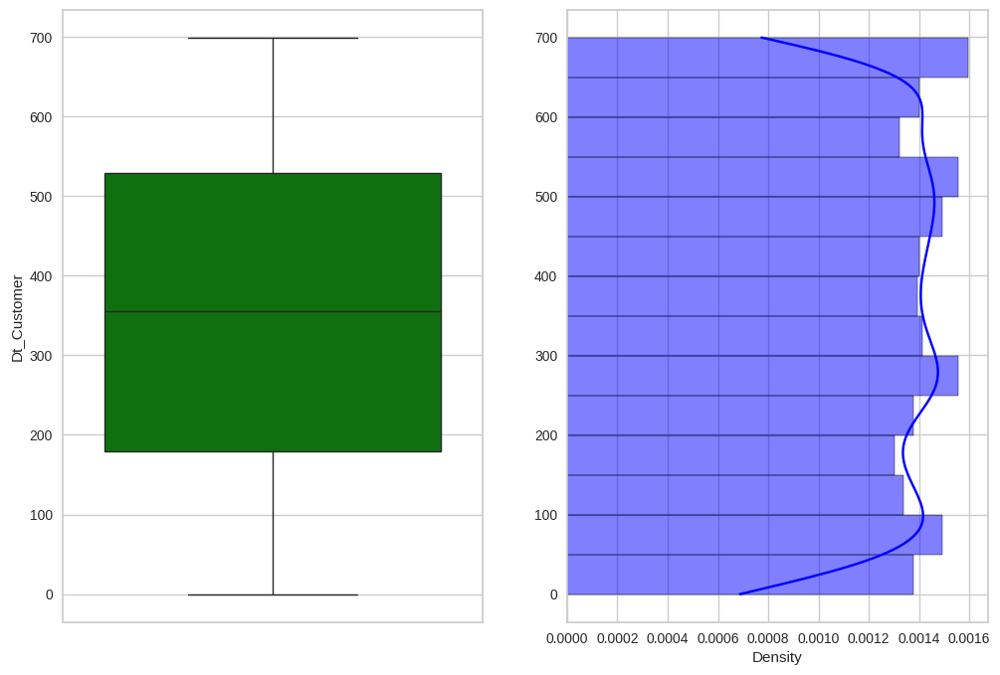

In [785]:
plot_features(people_df, 'Dt_Customer')

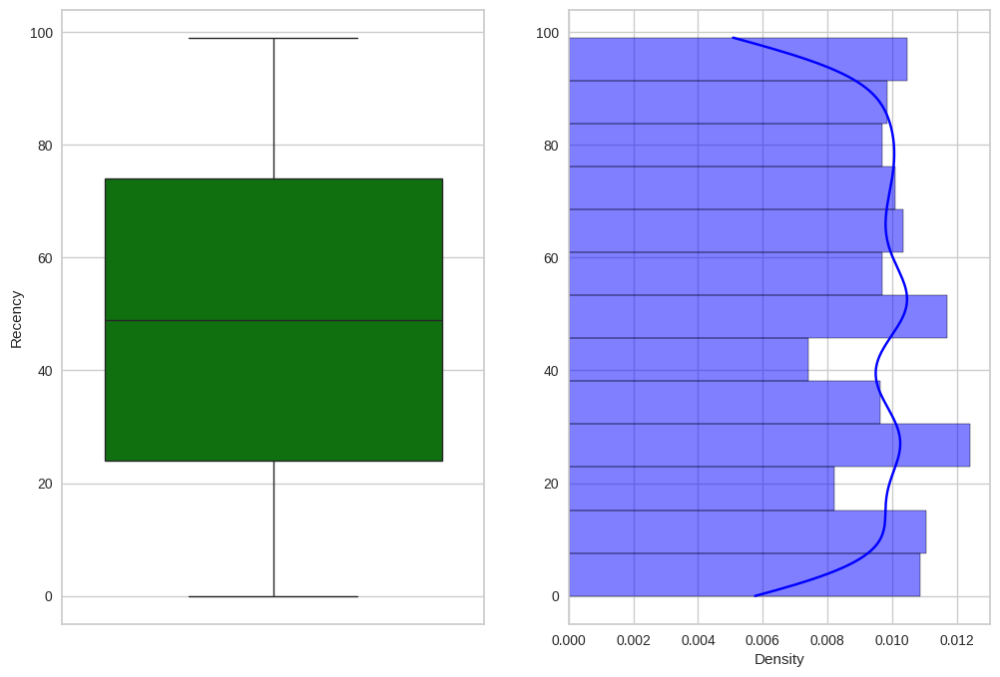

In [786]:
plot_features(people_df, 'Recency')

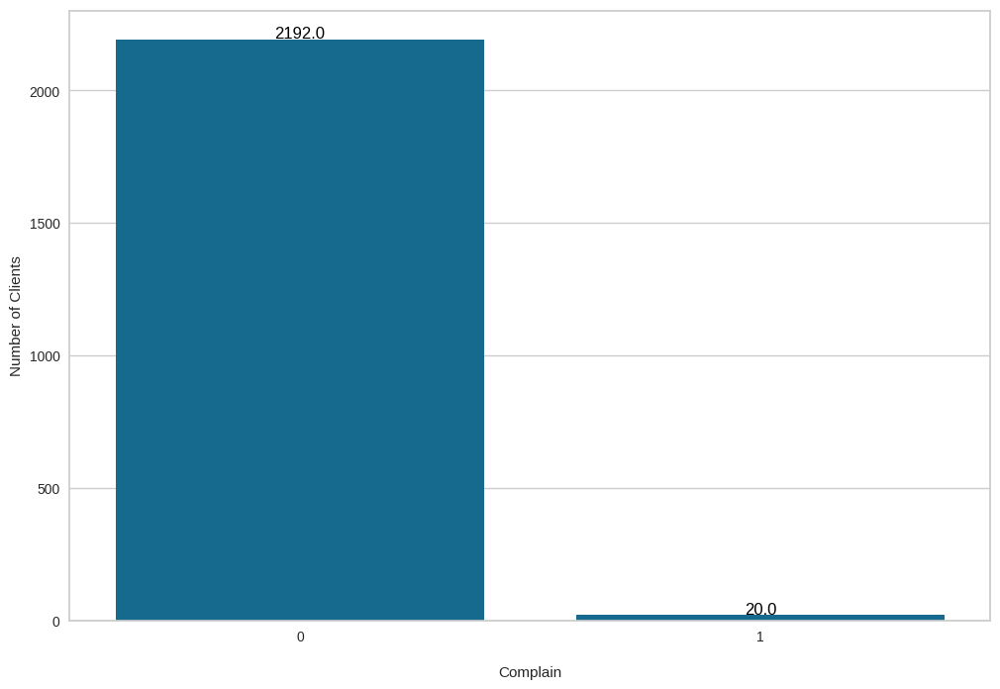

In [787]:
plot_features(people_df, 'Complain', numerical=False)

Since only 20 clients have complaints, this column doesn't seem important and will be dropped.

In [788]:
people_df = people_df.drop(['Complain'], axis=1)

# Products

In [789]:
products_columns = ['ID', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
                    'MntSweetProducts', 'MntGoldProds']
products_df = df[products_columns]

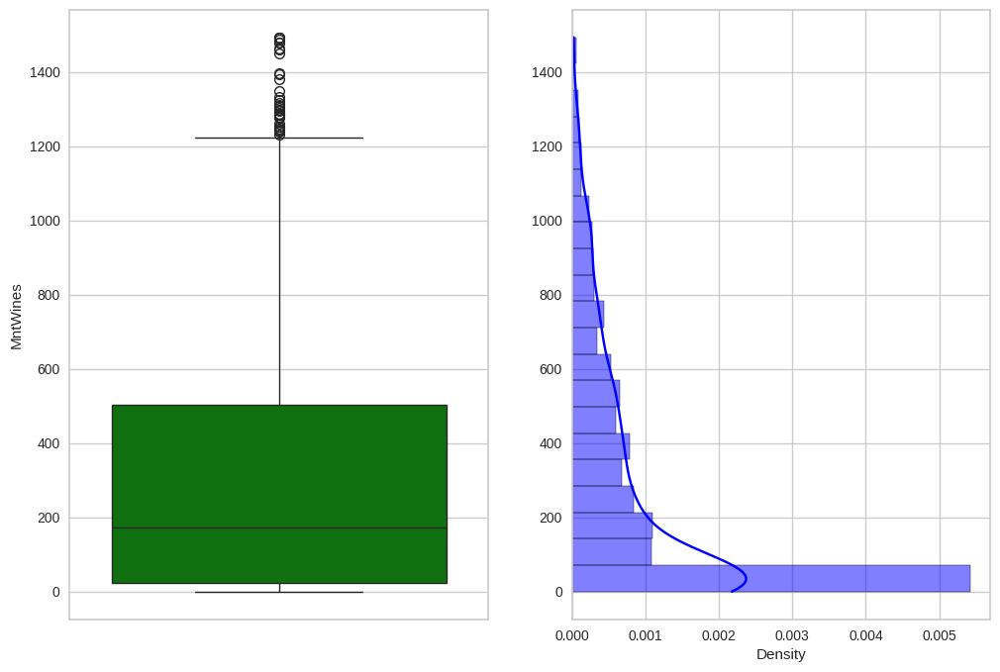

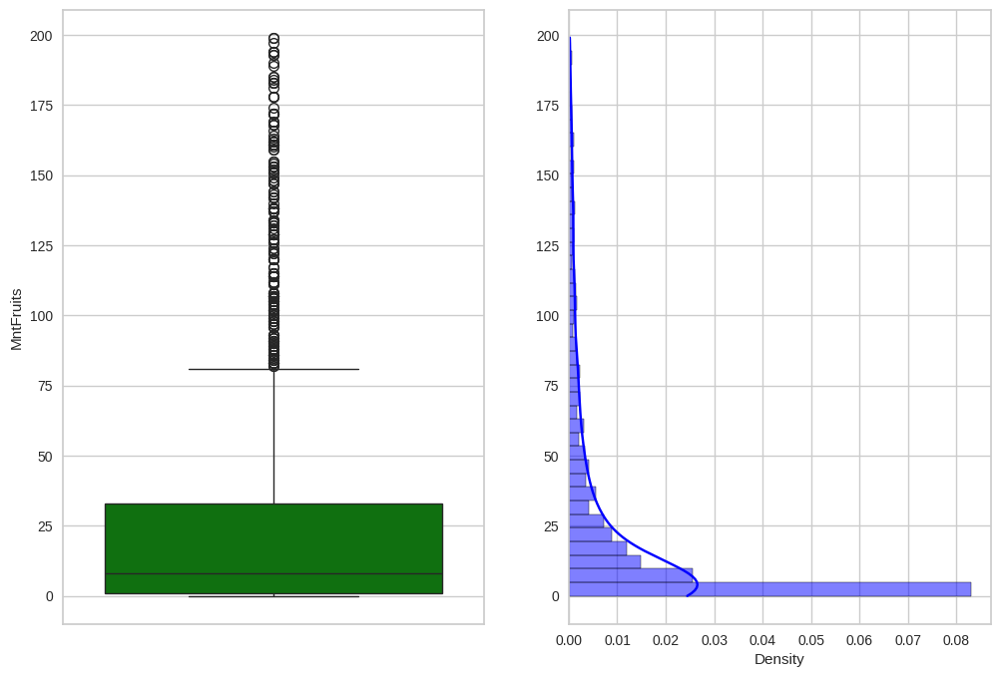

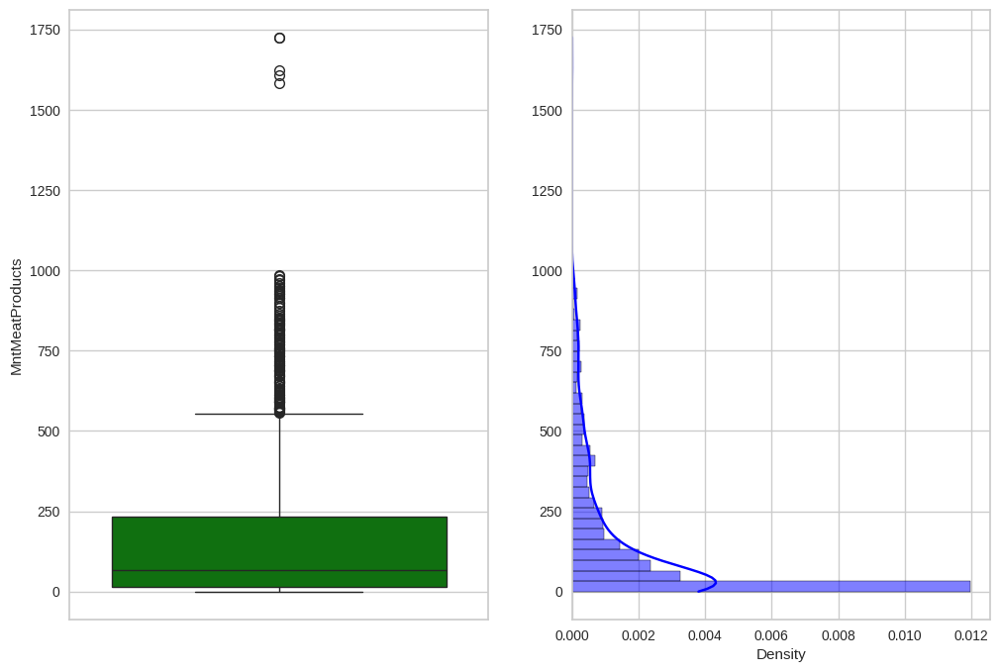

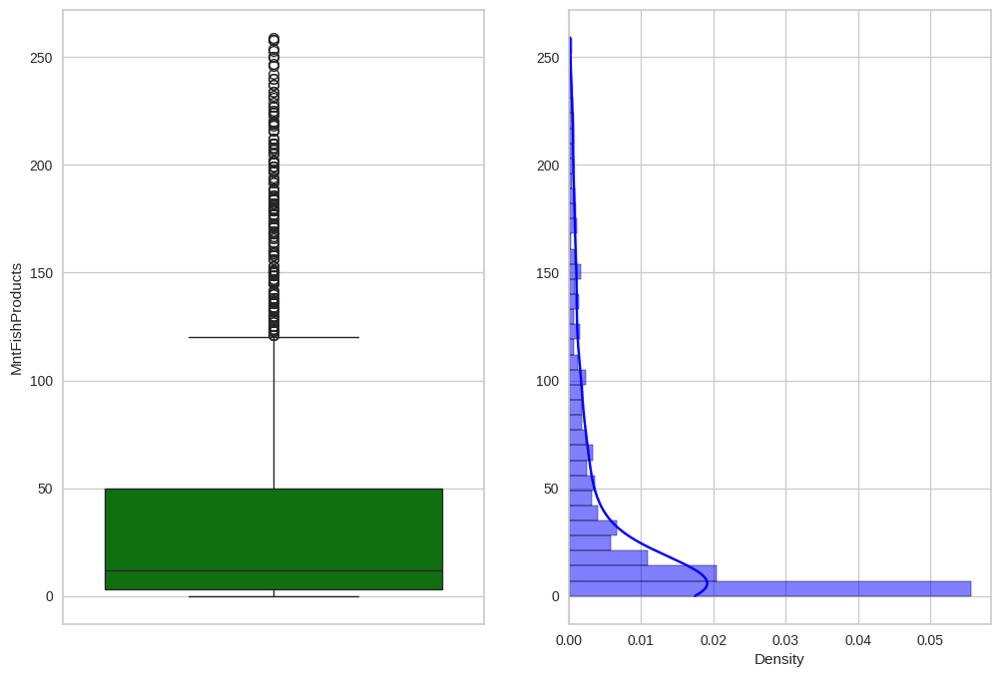

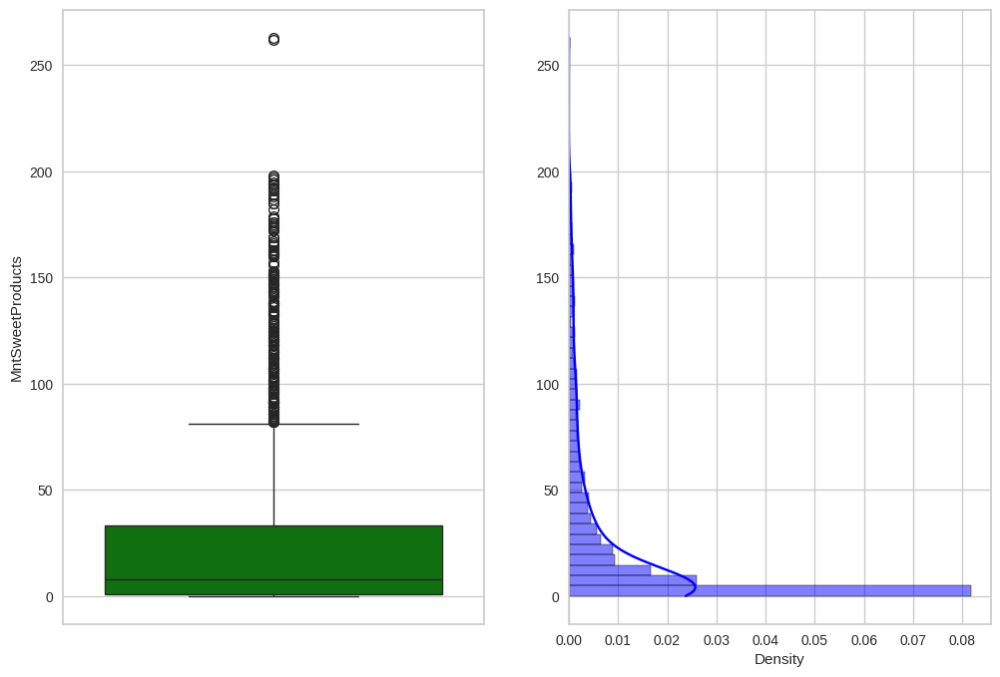

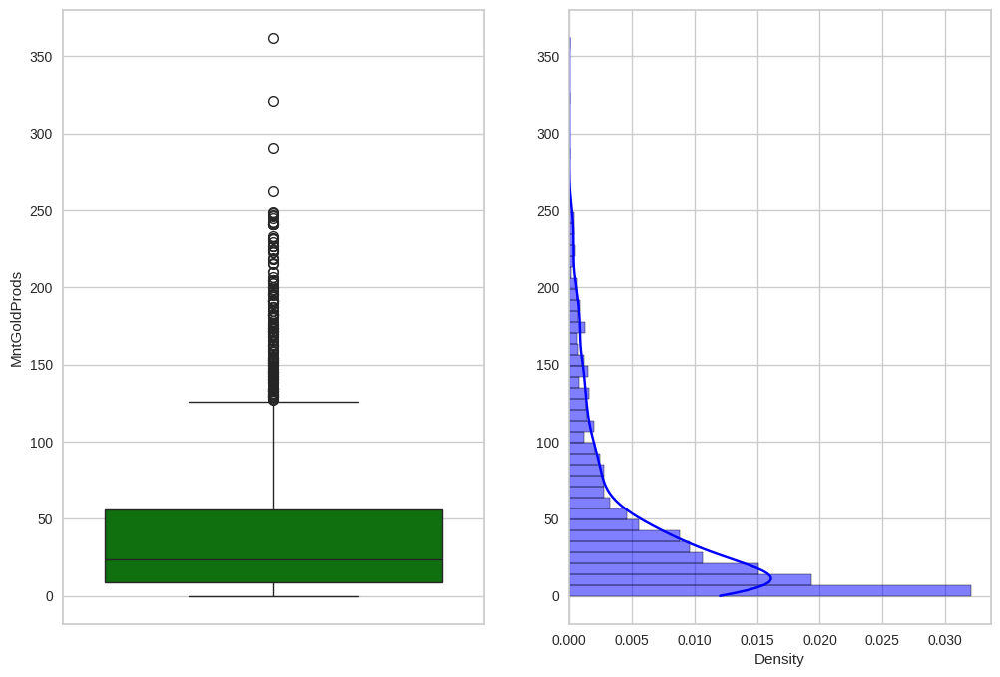

In [790]:
for prod in ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
              'MntSweetProducts', 'MntGoldProds']:
  plot_features(products_df, prod)

Here, it is interesting to create a column representing the Total spent.

In [791]:
products_df['Total_Spent'] = products_df['MntWines'] + products_df['MntFruits'] + products_df['MntMeatProducts'] + products_df['MntFishProducts'] + products_df['MntSweetProducts'] + products_df['MntGoldProds']


<ipython-input-791-d661c420471d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_df['Total_Spent'] = products_df['MntWines'] + products_df['MntFruits'] + products_df['MntMeatProducts'] + products_df['MntFishProducts'] + products_df['MntSweetProducts'] + products_df['MntGoldProds']


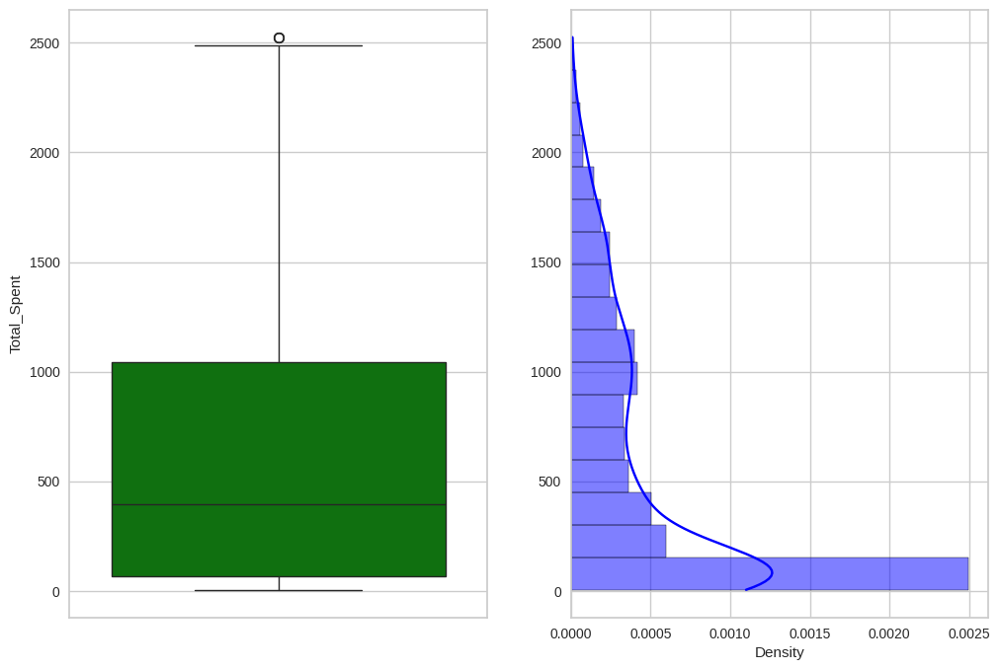

In [792]:
plot_features(products_df, 'Total_Spent')

# Promotion

In [793]:
promotion_columns = ['ID', 'NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2',
                     'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']
promotion_df = df[promotion_columns]

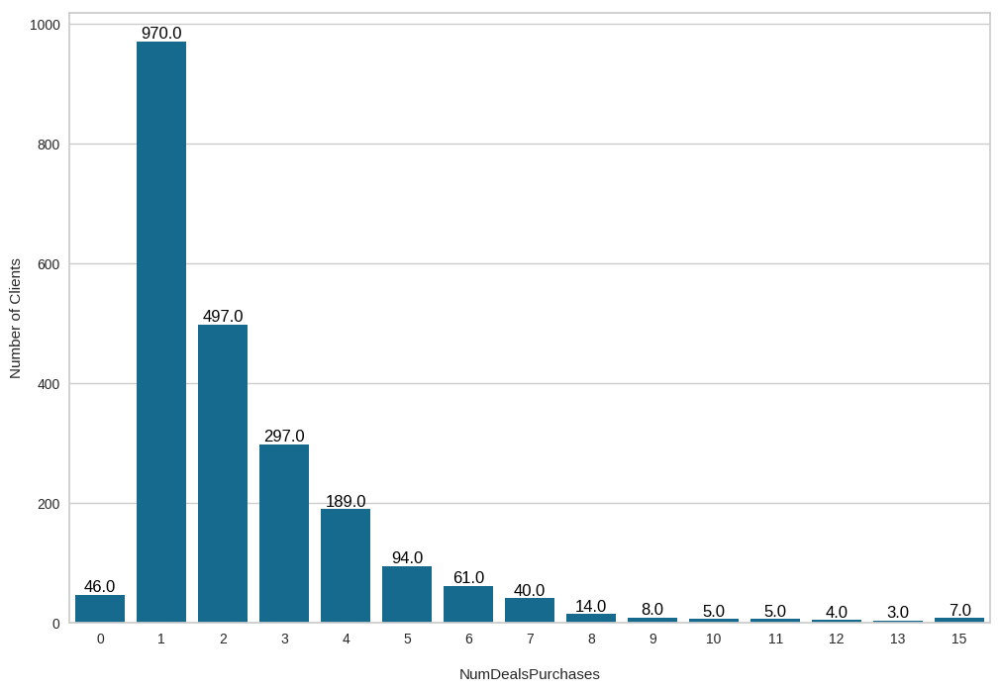

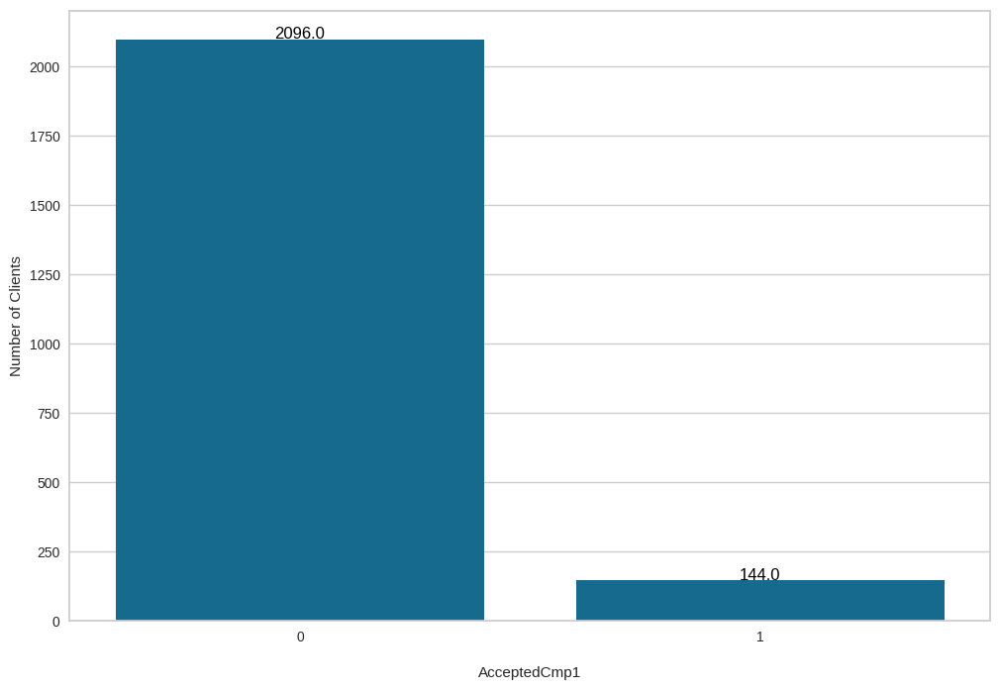

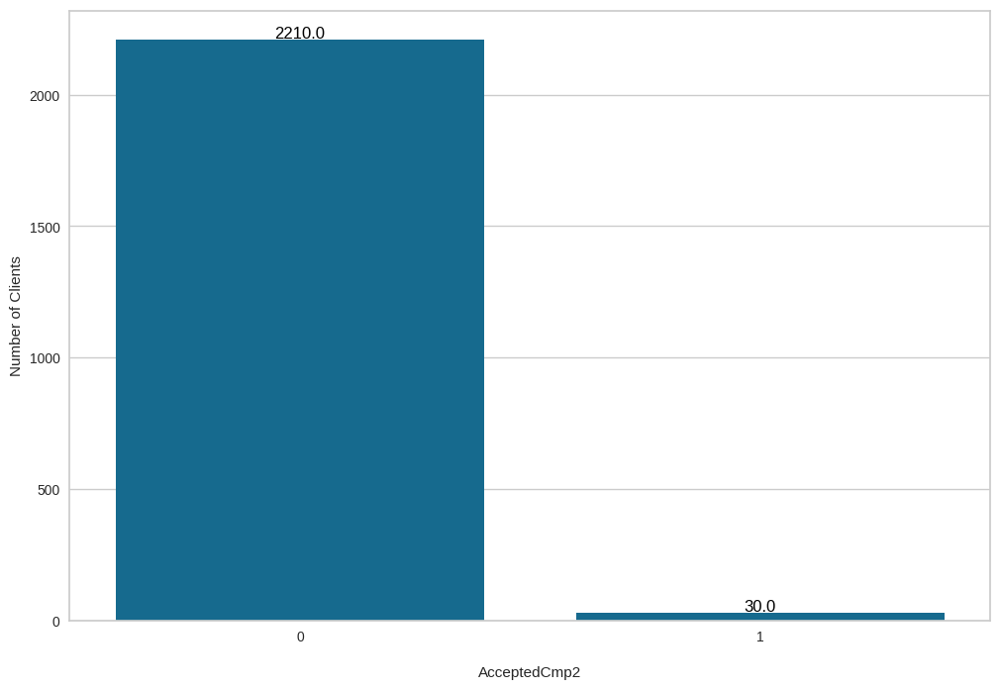

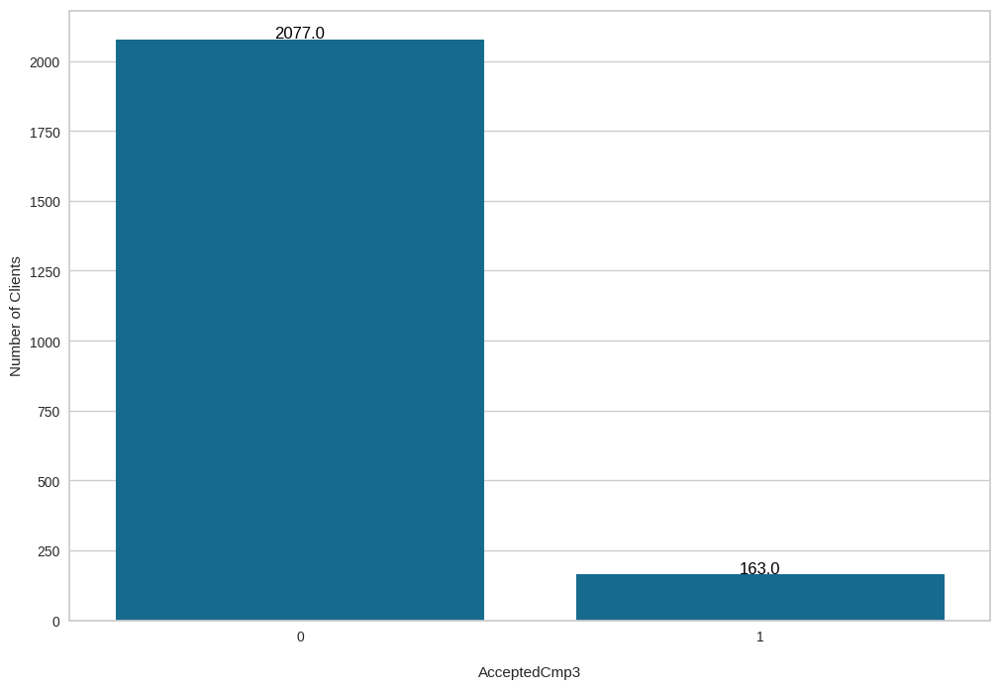

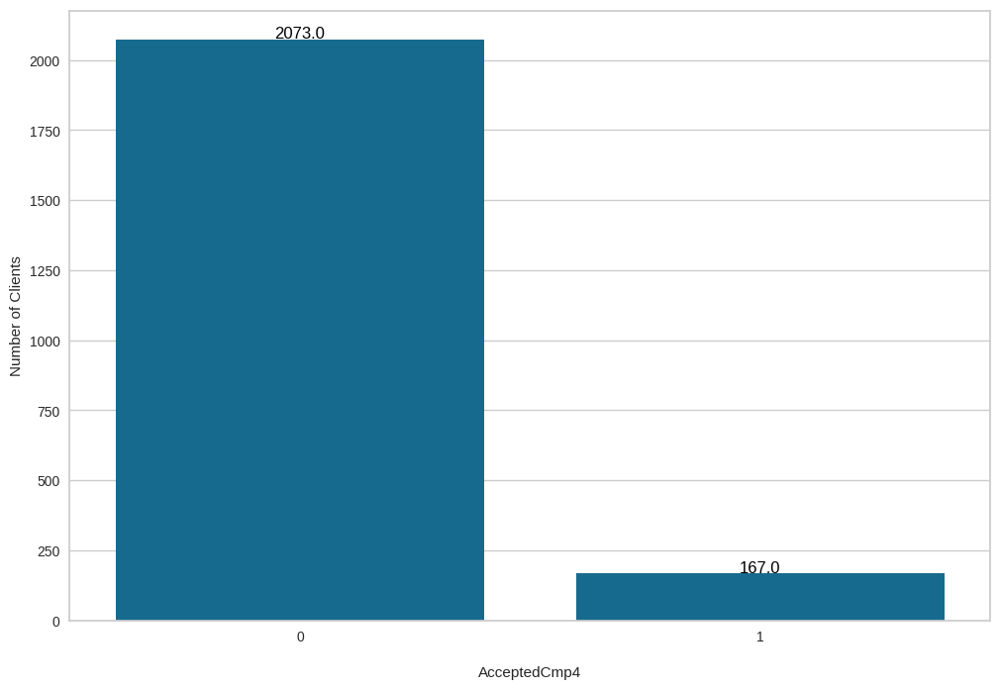

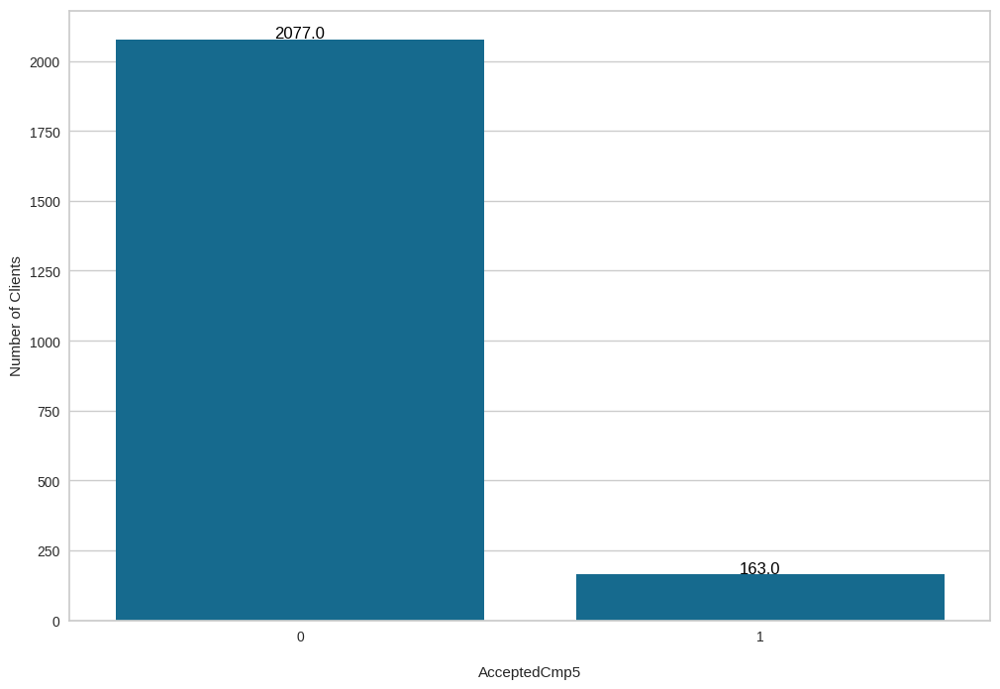

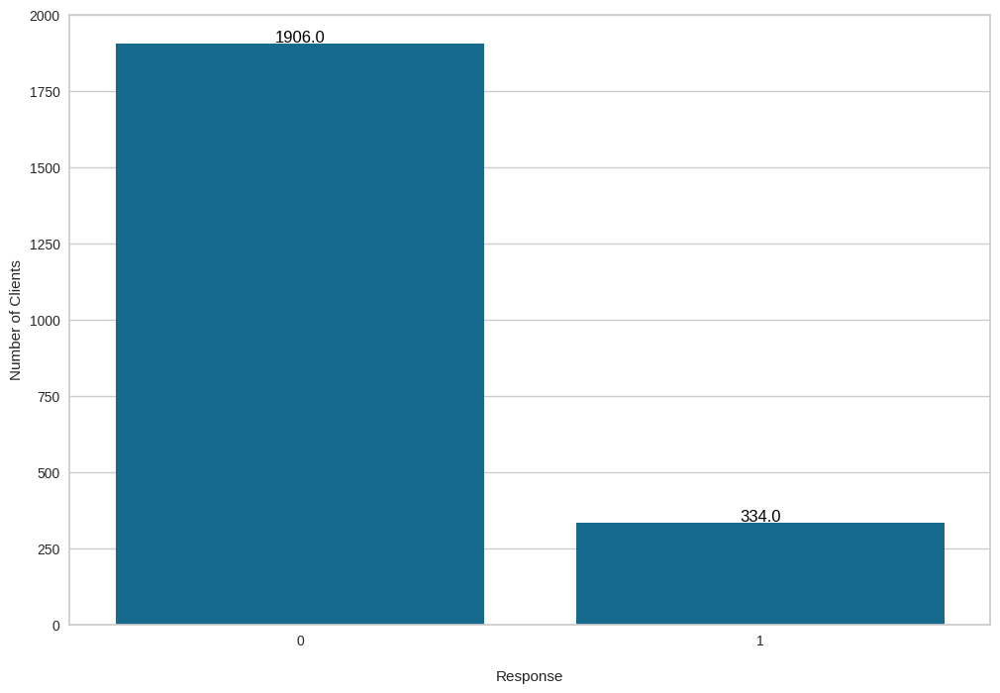

In [794]:
plot_features(promotion_df, 'NumDealsPurchases', numerical=False)

for promotion in ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']:
  plot_features(promotion_df, promotion, numerical=False)

Since we don´t have any context on what each of the campaigns mean, we will summarize all of them in a single column, and then drop the individual campaings.

In [795]:
promotion_df['Accepted_Campaigns'] = promotion_df['AcceptedCmp1'] + promotion_df['AcceptedCmp2'] + promotion_df['AcceptedCmp3'] + promotion_df['AcceptedCmp4'] + promotion_df['AcceptedCmp5'] + promotion_df['Response']

promotion_df = promotion_df.drop(['AcceptedCmp1', 'AcceptedCmp2','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response'], axis=1)

<ipython-input-795-8d8c657d884c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  promotion_df['Accepted_Campaigns'] = promotion_df['AcceptedCmp1'] + promotion_df['AcceptedCmp2'] + promotion_df['AcceptedCmp3'] + promotion_df['AcceptedCmp4'] + promotion_df['AcceptedCmp5'] + promotion_df['Response']


#Place

In [796]:
place_columns = ['ID', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
                 'NumWebVisitsMonth']
place_df = df[place_columns]

In [797]:
place_df.describe()

,ID,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,4.084821,2.662054,5.790179,5.316518
std,3246.662198,2.778714,2.923101,3.250958,2.426645
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,2.000000,0.000000,3.000000,3.000000
50%,5458.500000,4.000000,2.000000,5.000000,6.000000
75%,8427.750000,6.000000,4.000000,8.000000,7.000000
max,11191.000000,27.000000,28.000000,13.000000,20.000000


In [798]:
place_df['Number_Purchases'] = place_df['NumWebPurchases'] + place_df['NumCatalogPurchases'] + place_df['NumStorePurchases']

place_df = place_df[place_df['Number_Purchases'] > 0]

<ipython-input-798-84220c0e2583>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  place_df['Number_Purchases'] = place_df['NumWebPurchases'] + place_df['NumCatalogPurchases'] + place_df['NumStorePurchases']


In [799]:
for col in ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']:
  place_df[col] = place_df[col] / place_df['Number_Purchases']

<ipython-input-799-d70b35830a6a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  place_df[col] = place_df[col] / place_df['Number_Purchases']


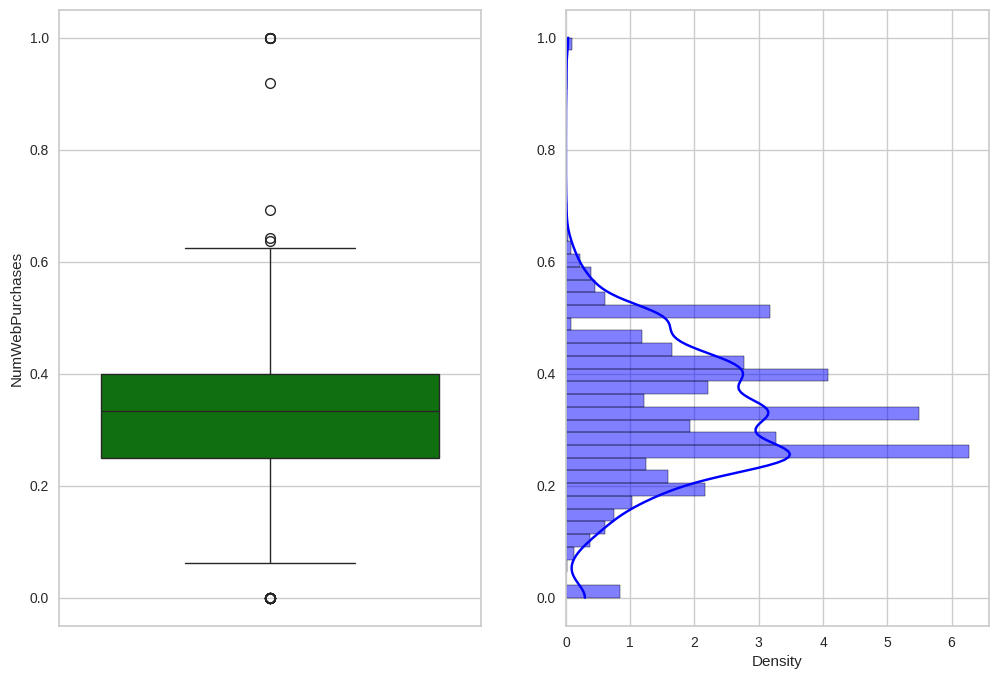

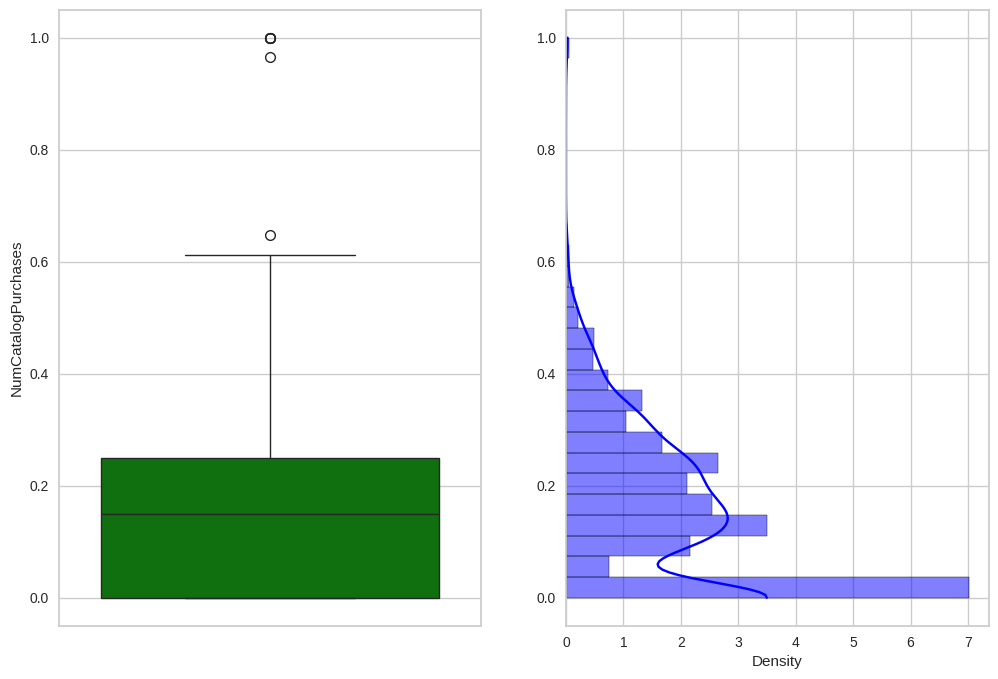

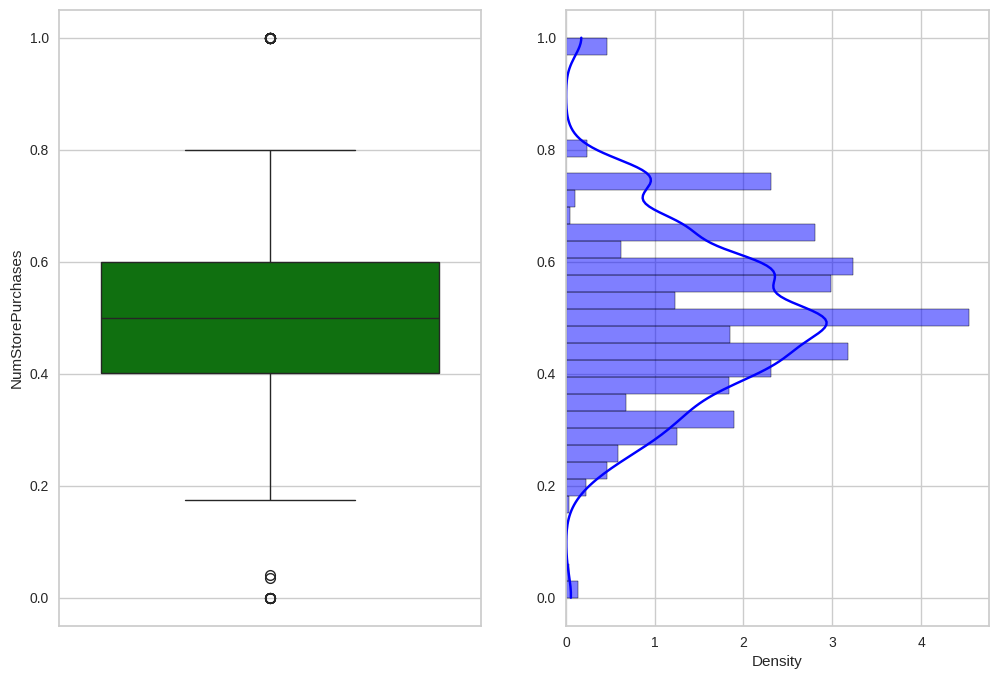

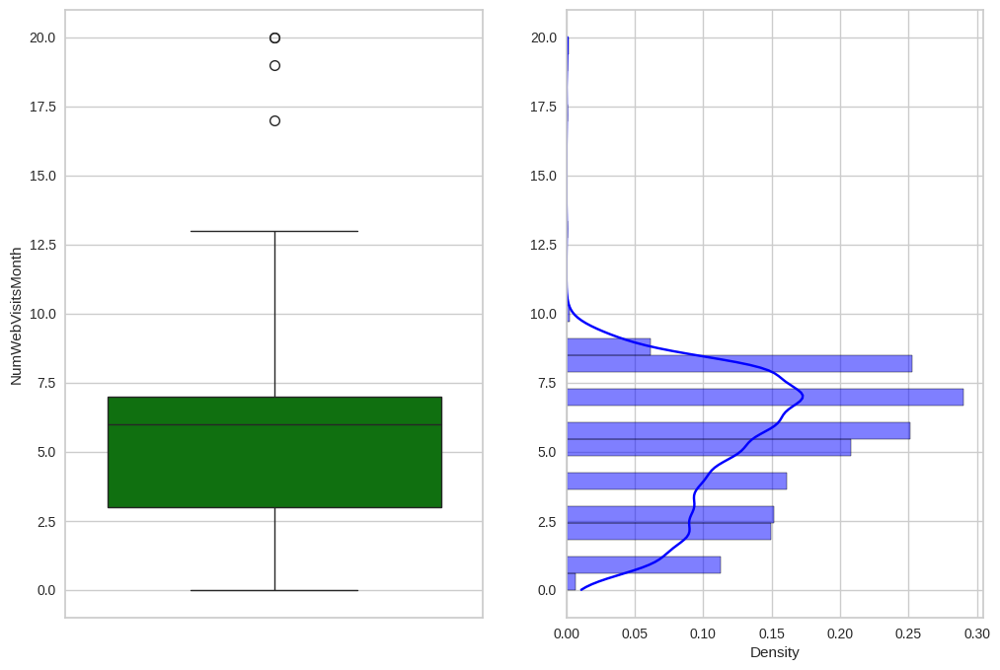

In [800]:
for promotion in ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']:
  plot_features(place_df, promotion)

# Joining all Dataframes and Feature Engineering

In [801]:
df_final = people_df.merge(products_df, on='ID', how='inner')
df_final = df_final.merge(promotion_df, on='ID', how='inner')
df_final = df_final.merge(place_df, on='ID', how='inner')

In [802]:
#Let´s create two new features:
#Average Ticket
df_final['AvgTicket'] = df_final['Total_Spent']/df_final['Number_Purchases']

#number of people in the household
df_final['NumPeopleHousehold'] = df_final['Kidhome'] + df_final['Teenhome'] + (df_final['Lives_With_Someone']+1)

In [803]:
 df_final.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold
0,5524,2,Single,58138.0,0,0,663,58,57,0,635,88,546,172,88,88,1617,3,1,0.363636,0.454545,0.181818,7,22,73.500000,1
1,2174,2,Single,46344.0,1,1,113,38,60,0,11,1,6,2,1,6,27,2,0,0.250000,0.250000,0.500000,5,4,6.750000,3
2,4141,2,Together,71613.0,0,0,312,26,49,1,426,49,127,111,21,42,776,1,0,0.400000,0.100000,0.500000,4,20,38.800000,2
3,6182,2,Together,26646.0,1,0,139,26,30,1,11,4,20,10,3,5,53,2,0,0.333333,0.000000,0.666667,6,6,8.833333,3
4,5324,4,Married,58293.0,1,0,161,94,33,1,173,43,118,46,27,15,422,5,0,0.357143,0.214286,0.428571,5,14,30.142857,3


In [804]:
print(df_final.shape)
print(df_final.columns)

(2206, 26)
Index(['ID', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'Age', 'Lives_With_Someone', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Total_Spent', 'NumDealsPurchases',
       'Accepted_Campaigns', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Number_Purchases',
       'AvgTicket', 'NumPeopleHousehold'],
      dtype='object')


Assim, ficamos com 2.206 ocorrências e 26 colunas.



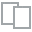
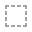
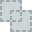
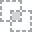
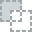
...
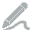
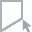
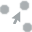
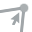
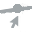

In [805]:

plot(df_final)


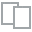
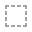
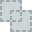
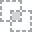
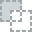
...
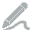
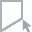
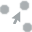
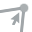
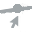

In [806]:
plot_correlation(df_final)

From the correlation matrix above, we can notice that the amount spent in each category is highly correlated, that is, as the person increases their spend in a category, it also spends more in other categories too. e can also notice that the *income* is highly correlated to *number_purchases* and the *NumCatalogPurchasses*

# Encoding

Clustering algorithms are sensitive to the scale of the data, as they are closely tied to distance measures. Therefore, numerical features will be scaled using the Standard Scaler.

Categorical variables need to be transformed into numerical ones to go through the algorithm. Therefore, we will use OneHot Encoding for *'Marital_Status'*.

In [807]:
ohe = OneHotEncoder(sparse=False)

marital_ohe = pd.DataFrame(ohe.fit_transform(df_final[['Marital_Status']]), columns=ohe.get_feature_names_out())

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [808]:
df_final = pd.concat([df_final.reset_index(drop=True), marital_ohe], axis=1)

In [809]:
df_final.columns

Index(['ID', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'Age', 'Lives_With_Someone', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Total_Spent', 'NumDealsPurchases',
       'Accepted_Campaigns', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Number_Purchases',
       'AvgTicket', 'NumPeopleHousehold', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Together', 'Marital_Status_Widow'],
      dtype='object')


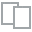
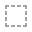
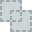
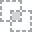
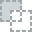
...
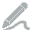
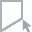
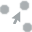
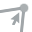
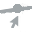

In [810]:
plot(df_final)

In [811]:
# Now lastly, let's select the columns we will use in the model.
cols_to_exclude = ['ID', 'Marital_Status']

df_model = df_final.drop(columns=cols_to_exclude).copy()
df_model.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency',
       'Age', 'Lives_With_Someone', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'Total_Spent',
       'NumDealsPurchases', 'Accepted_Campaigns', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Number_Purchases', 'AvgTicket', 'NumPeopleHousehold',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow'],
      dtype='object')

Ok, agora todas as colunas presentes no dataframe são numéricas, e serão escalonadas usando o StandardScaler, exceto algumas:

In [812]:
cols_to_scale = ['Education', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency',
       'Age', 'Lives_With_Someone', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'Total_Spent',
       'NumDealsPurchases', 'Accepted_Campaigns', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Number_Purchases', 'AvgTicket', 'NumPeopleHousehold',]

cols_not_to_scale = ['Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow']

In [813]:
scaler = StandardScaler()

scaler.fit(df_model[cols_to_scale])
df_scaled = pd.DataFrame(scaler.transform(df_model[cols_to_scale]), columns=cols_to_scale)

In [814]:
df_scaled_full = pd.concat([df_model[cols_not_to_scale], df_scaled], axis=1)

In [815]:
df_scaled_full.shape

(2206, 29)

In [816]:
df_scaled_full.head()

,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold
0,0.0,0.0,1.0,0.0,0.0,-0.458244,0.291407,-0.823092,-0.931215,1.526331,0.310912,1.018496,-1.352111,0.974963,1.549059,1.687245,2.449823,1.480786,0.849960,1.673525,0.361994,0.615252,0.280123,2.059173,-2.169914,0.714759,1.308371,1.195941,-1.763261
1,0.0,0.0,1.0,0.0,0.0,-0.458244,-0.264252,1.039206,0.906228,-1.192629,-0.380038,1.274795,-1.352111,-0.874837,-0.638697,-0.719794,-0.652347,-0.635259,-0.735592,-0.966002,-0.168258,-0.503665,-0.658881,0.603558,-0.034077,-0.128878,-1.197311,-1.024683,0.447454
2,0.0,0.0,0.0,1.0,0.0,-0.458244,0.926264,-0.823092,-0.931215,-0.208860,-0.794608,0.335032,0.739584,0.355399,0.568341,-0.180439,1.336691,-0.148812,-0.039496,0.277398,-0.698509,-0.503665,0.580604,-0.463893,-0.034077,-0.550697,1.029962,0.041549,-0.657903
3,0.0,0.0,0.0,1.0,0.0,-0.458244,-1.192298,1.039206,-0.931215,-1.064096,-0.794608,-1.288195,0.739584,-0.874837,-0.563257,-0.657389,-0.506363,-0.586614,-0.754928,-0.922840,-0.168258,-0.503665,0.029722,-1.175527,1.084694,0.292940,-0.918902,-0.955376,0.447454
4,0.0,1.0,0.0,0.0,0.0,1.533651,0.298709,1.039206,-0.931215,-0.955338,1.554622,-1.031896,0.739584,-0.394600,0.417461,-0.220556,0.150567,-0.002878,-0.561568,-0.310270,1.422497,-0.503665,0.226466,0.349403,-0.513551,-0.128878,0.194735,-0.246455,0.447454


#Dimensionality reduction
We have a lot of features, and this can lead us to the "dimensionality curse", where our samples become too sparse in the space. For this reason, we will use PCA to reduce the dimensionality.

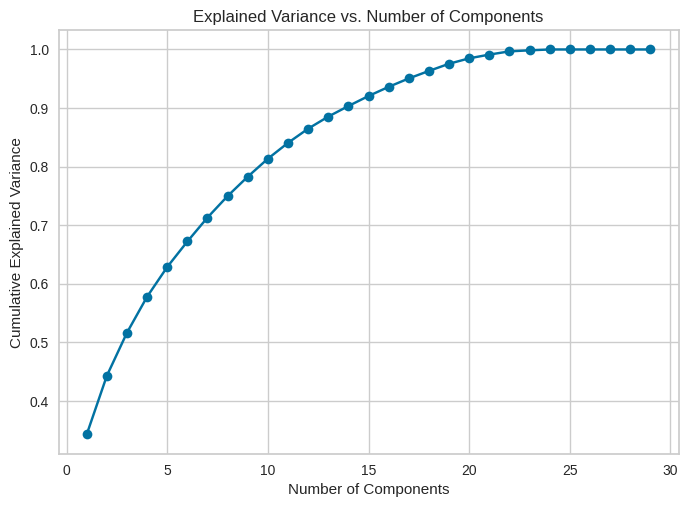

In [817]:
pca = PCA(n_components=29)
df_pca = pca.fit_transform(df_scaled_full)

# Plotando a variância cumulativa do PCA
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
cumulative_variance

plt.plot(range(1,30),cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

From the 29 original features, PCA can help us continue with 14 features while mantaining 90% of our Variance Explained!

In [818]:
pca = PCA(n_components=14)
df_pca = pca.fit_transform(df_scaled_full)

# Modeling

Since we don't have any business request or information, that is, we don't have a desired number of clusters or anything, we will use the "Elbow Method" to choose a number of clusters.

This method is based on de WCSS (Within Cluster Sum of Squares), the sum of the squared distance from each point to the centroid of its cluster. Here, although we want a small WCSS, we will not choose the smallest, because we want the number when the graph stops to descrease rapidly and becomes more constant (which is "the elbow").

The Yellowbricks Library has a method that does this for us, but we can also perform the same method for other metrics, such as the Silhouette Score and Calisnki-Harabasz:


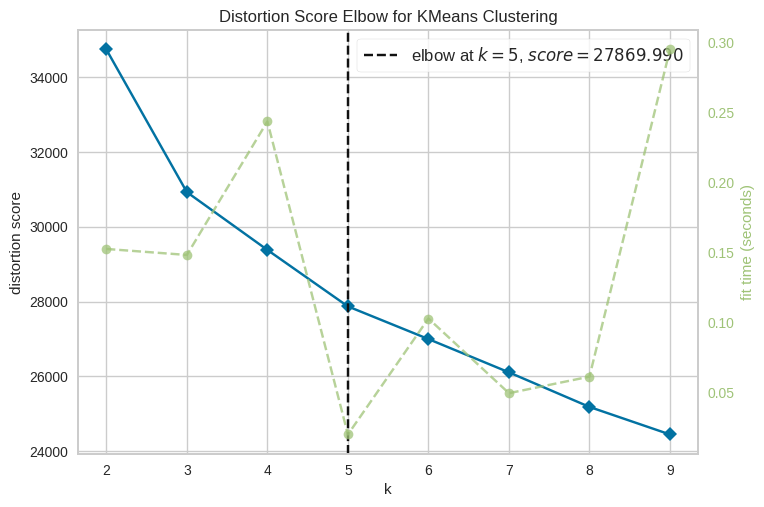

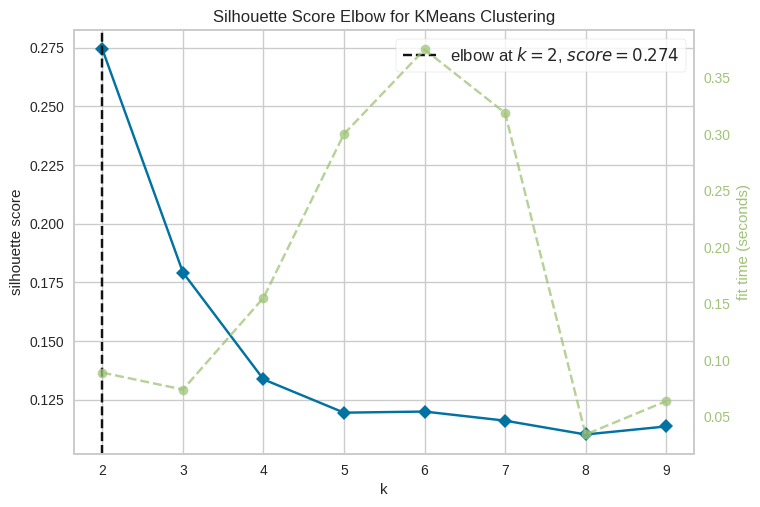

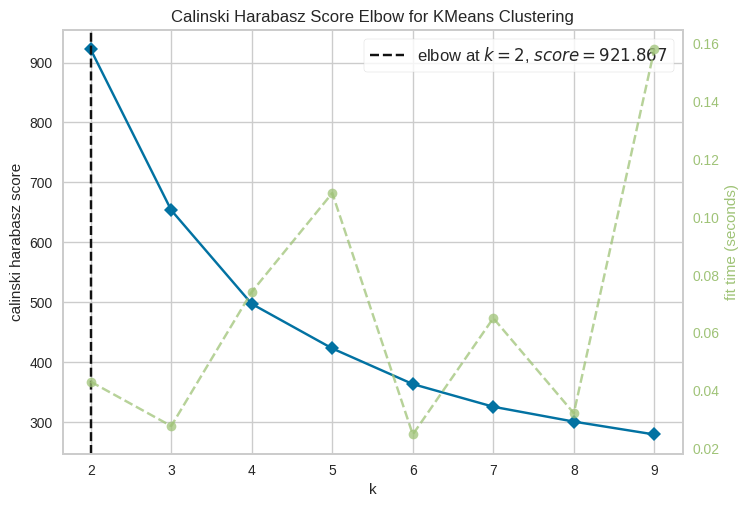

KElbowVisualizer(ax=<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>,
                 estimator=KMeans(n_clusters=9, n_init='auto', random_state=42),
                 k=(2, 10), metric='calinski_harabasz')

In [819]:
kelbow_visualizer(KMeans(n_init ='auto', random_state=42), df_pca, k=(2, 10))
kelbow_visualizer(KMeans(n_init ='auto', random_state=42), df_pca, k=(2, 10), metric='silhouette')
kelbow_visualizer(KMeans(n_init ='auto', random_state=42), df_pca, k=(2, 10), metric='calinski_harabasz')

While the Elbow Method tells us to use k=5, the other scores indicate we should use k=2. Therefore, we will perform and visualize KMeans with both.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Axes: xlabel='0', ylabel='1'>

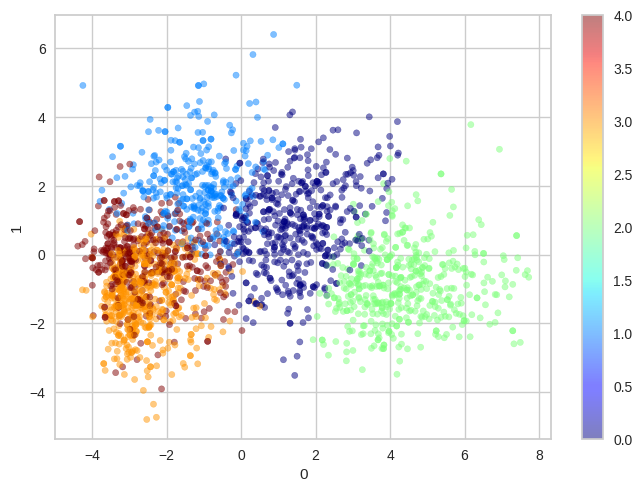

In [820]:
model_kmeans_5 = KMeans(n_clusters=5, random_state=42)
model_kmeans_5_fitted = model_kmeans_5.fit(df_pca)
pd.DataFrame(df_pca).plot.scatter(x=0, y=1, c=model_kmeans_5_fitted.labels_, colormap='jet', alpha=0.5)

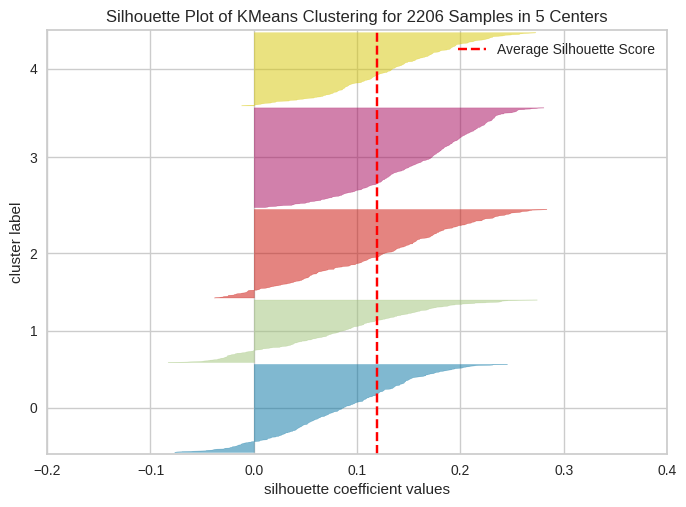

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2206 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [821]:
visualizador = SilhouetteVisualizer(model_kmeans_5_fitted, colors='yellowbrick')
visualizador.fit(df_pca)
visualizador.show()

The PCA features, although representing the variance of the features, are not very clear. Let's try to visualize the clusters in our original features

<Axes: xlabel='Income', ylabel='Total_Spent'>

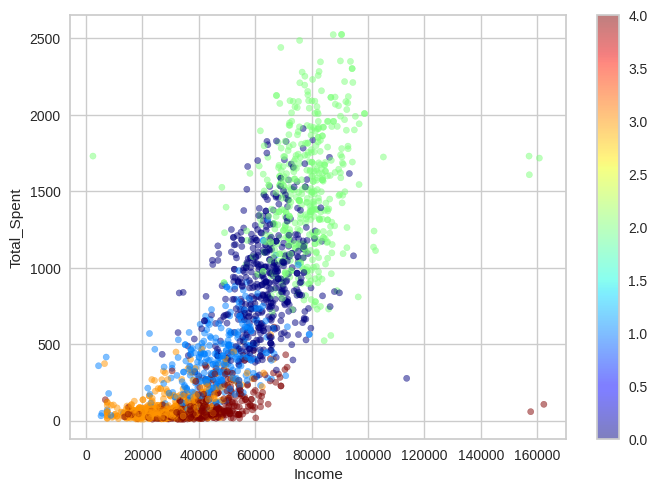

In [822]:
df_model.plot.scatter(x='Income', y='Total_Spent', c=model_kmeans_5_fitted.labels_, colormap='jet', alpha=0.5)

In [823]:
# Let's store the silhouette methos and caliski harabaz score
clusters_number = {'kmeans_5': model_kmeans_5_fitted.cluster_centers_.shape[0]}
sil_values = {'kmeans_5': silhouette_score(df_pca, model_kmeans_5_fitted.predict(df_pca))}
ch_values = {'kmeans_5': calinski_harabasz_score(df_pca, model_kmeans_5_fitted.predict(df_pca))}
db_values = {'kmeans_5': davies_bouldin_score(df_pca, model_kmeans_5_fitted.predict(df_pca))}

Now we do the same for K=2.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Axes: xlabel='0', ylabel='1'>

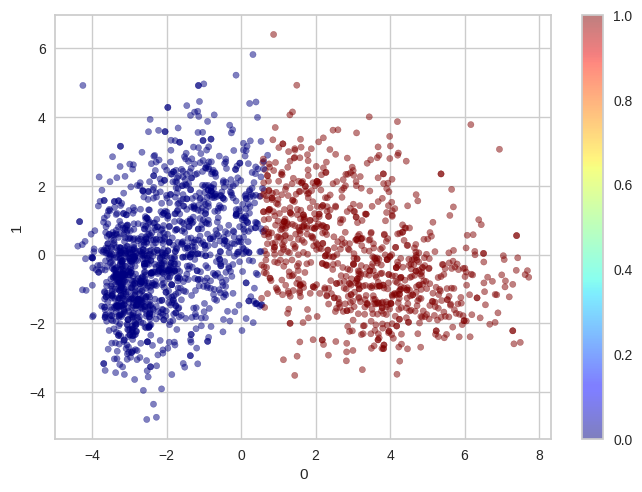

In [824]:
model_kmeans_2 = KMeans(n_clusters=2, random_state=42)
model_kmeans_2_fitted = model_kmeans_2.fit(df_pca)
pd.DataFrame(df_pca).plot.scatter(x=0, y=1, c=model_kmeans_2_fitted.labels_, colormap='jet', alpha=0.5)

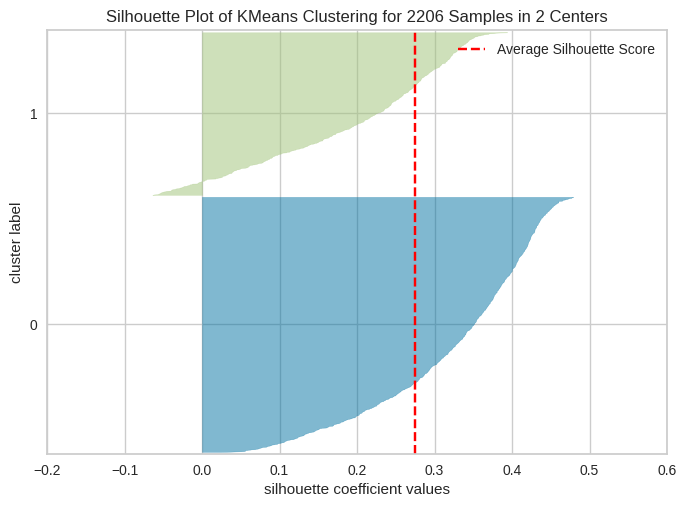

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2206 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [825]:
visualizador = SilhouetteVisualizer(model_kmeans_2_fitted, colors='yellowbrick')
visualizador.fit(df_pca)
visualizador.show()

<Axes: xlabel='Income', ylabel='Total_Spent'>

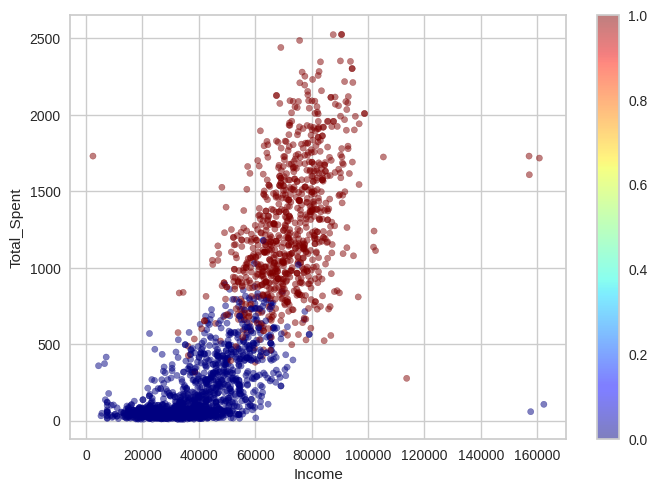

In [826]:
df_model.plot.scatter(x='Income', y='Total_Spent', c=model_kmeans_2_fitted.labels_, colormap='jet', alpha=0.5)

In [827]:
# Let's store the silhouette methos and caliski harabaz score
clusters_number['kmeans_2'] = model_kmeans_2_fitted.cluster_centers_.shape[0]
sil_values['kmeans_2'] =  silhouette_score(df_pca, model_kmeans_2_fitted.predict(df_pca))
ch_values['kmeans_2'] = calinski_harabasz_score(df_pca, model_kmeans_2_fitted.predict(df_pca))
db_values['kmeans_2'] = davies_bouldin_score(df_pca, model_kmeans_2_fitted.predict(df_pca))

In [828]:
pd.DataFrame([clusters_number, sil_values, ch_values, db_values], index=['# of clusters', 'Silhouette Score', 'Calinski Harabasz Score', 'Davies-Bouldin Score'])

,kmeans_5,kmeans_2
# of clusters,5.000000,2.000000
Silhouette Score,0.119085,0.274169
Calinski Harabasz Score,422.726526,921.867350
Davies-Bouldin Score,2.201019,1.489483


While the scores for KMeans with K=2 is better, our business might want more clusters to have a more refined view of the clients. We will continue with the exploration of more algorithms, and then we will select one of the results to analyze.

# Modeling: Aglomerative Clustering
Agglomerative Clustering is a type of Hierarchical Clustering that starts from the bottom and goes up, that is, each point starts as its own cluster, and then the points agglomerate until they are all on the same cluster. It uses linkage distance with the 'ward' criterion, which means we will be merging clusters thar minimie the variance.

In [829]:
scores_silhouette = []
scores_ch = []
scores_db = []

for i in range(2,24):
  model_ag = AgglomerativeClustering(n_clusters=i, linkage='ward', compute_distances=True)
  model_ag_fit = model_ag.fit(df_pca)

  scores_silhouette.append(silhouette_score(df_pca, model_ag_fit.labels_))
  scores_ch.append(calinski_harabasz_score(df_pca, model_ag_fit.labels_))
  scores_db.append(davies_bouldin_score(df_pca, model_ag_fit.labels_))

In [830]:
# let's find out which is the best number of clusters in this case
print(f"Using Silhouette score: {scores_silhouette.index(max(scores_silhouette)) + 2}")
print(f"Using CH Score: {scores_ch.index(max(scores_ch)) + 2}")
print(f"Using DB Score: {scores_db.index(min(scores_db)) + 2}")


Using Silhouette score: 2
Using CH Score: 2
Using DB Score: 2


In [831]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

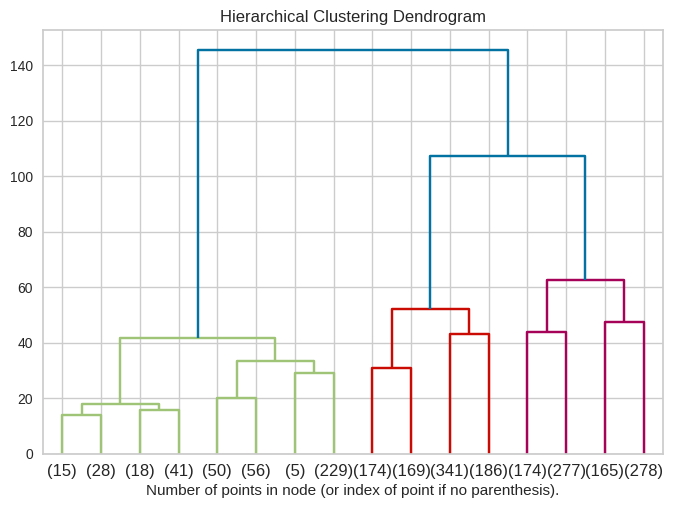

In [832]:
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(ward_agg_model_fitted, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [833]:
ward_agg_model = AgglomerativeClustering(n_clusters=2, linkage='ward', compute_distances=True)
ward_agg_model_fitted = ward_agg_model.fit(df_pca)
ward_agg_model_fitted.labels_

array([1, 0, 0, ..., 0, 1, 0])

In [834]:
silhouette_score(df_pca, ward_agg_model_fitted.labels_)

0.2587249066237949

In [835]:
clusters_number['agg_ward'] = ward_agg_model_fitted.n_clusters_
sil_values['agg_ward'] =  silhouette_score(df_pca, ward_agg_model_fitted.labels_)
ch_values['agg_ward'] = calinski_harabasz_score(df_pca, ward_agg_model_fitted.labels_)
db_values['agg_ward'] = davies_bouldin_score(df_pca, ward_agg_model_fitted.labels_)

It is interesting to see that the best metrics for this model still happen at 2 clusters. Let's keep these results for now and go on to our DBSCAN (Density-Based Spatial Clustering of Applications with Noise).

# Modeling: DBSCAN
DBSCAN identifies clusters with varying shapes by assessing density. Users define parameters such as epsilon (neighborhood radius) and min_samples (or minPts, the minimum neighbors required to be considered a core point), allowing for adaptable and precise clustering in diverse datasets.
A general rule of thumb for these parameters is:
* min_samples: 2 * dimension of the features
* epsilon: we plot a k-distance graph ordering the distance to the k=MinPts from largest to smallest value, selecting the value of distance where an "elbow" happens as the epsilon value.To choose the value of ε, a k-distance graph is plotted by ordering the distance to the k=MinPts nearest neighbor from the largest to the smallest value.

Font: https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd
https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

In [836]:
df_pca.shape

(2206, 14)

In [837]:
neighbors = NearestNeighbors(n_neighbors=28)
neighbors_fit = neighbors.fit(df_pca)
distances, indices = neighbors_fit.kneighbors(df_pca)

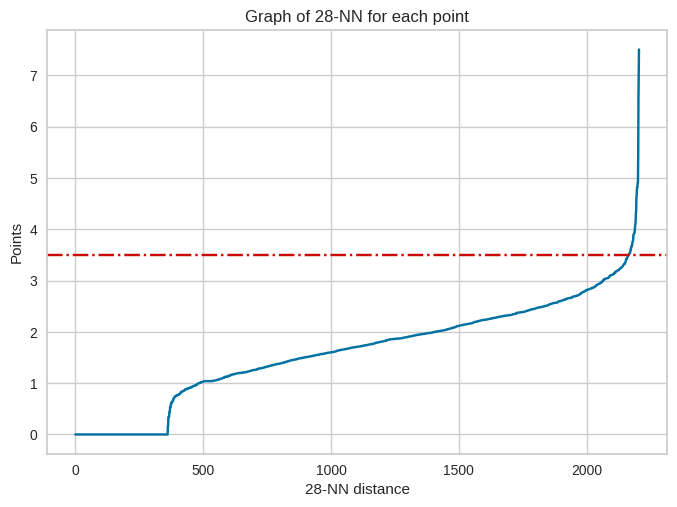

In [838]:
distances = np.sort(distances, axis=0)
distances_ = distances[:,1]
plt.plot(distances_)
plt.axhline(y=3.5, color='r', linestyle='-.')

plt.xlabel('28-NN distance')
plt.ylabel('Points')
plt.title('Graph of 28-NN for each point')

plt.show()

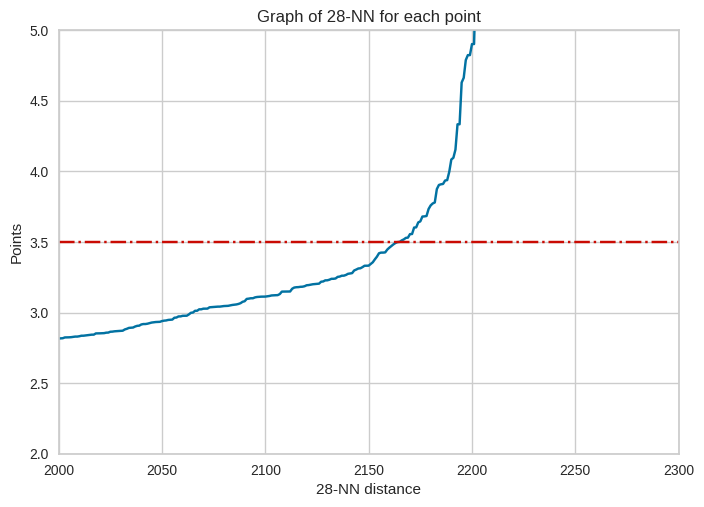

In [839]:
plt.plot(distances_)
plt.xlim(2000, 2300)
plt.ylim(2,5)
plt.axhline(y=3.5, color='r', linestyle='-.')

plt.xlabel('28-NN distance')
plt.ylabel('Points')
plt.title('Graph of 28-NN for each point')
# Show the plot
plt.show()

In [840]:
from sklearn.cluster import DBSCAN
dbscan_model_fitted = DBSCAN(eps=3.5, min_samples=20).fit(df_pca)
pd.Series(dbscan_model_fitted.labels_).nunique()

2

In [841]:
print(silhouette_score(df_pca, dbscan_model_fitted.labels_))

0.25805569441146514


In [842]:
clusters_number['dbscan'] = pd.Series(dbscan_model_fitted.labels_).nunique()
sil_values['dbscan'] =  silhouette_score(df_pca, dbscan_model_fitted.labels_)
ch_values['dbscan'] = calinski_harabasz_score(df_pca, dbscan_model_fitted.labels_)
db_values['dbscan'] = davies_bouldin_score(df_pca, dbscan_model_fitted.labels_)

# Evaluating Results
Now we will gather the results of our trained models, and choose one to analyze.

In [843]:
pd.DataFrame([clusters_number, sil_values, ch_values, db_values], index=['# of clusters', 'Silhouette Score', 'Calinski Harabasz Score', 'Davies-Bouldin Score'])

,kmeans_5,kmeans_2,agg_ward,dbscan
# of clusters,5.000000,2.000000,2.000000,2.000000
Silhouette Score,0.119085,0.274169,0.258725,0.258056
Calinski Harabasz Score,422.726526,921.867350,601.590620,110.807885
Davies-Bouldin Score,2.201019,1.489483,1.493809,2.307006


KMeans with 2 clusters has the best metrics for all scores, and therefore we will analyze those results.


<Axes: xlabel='Income', ylabel='Total_Spent'>

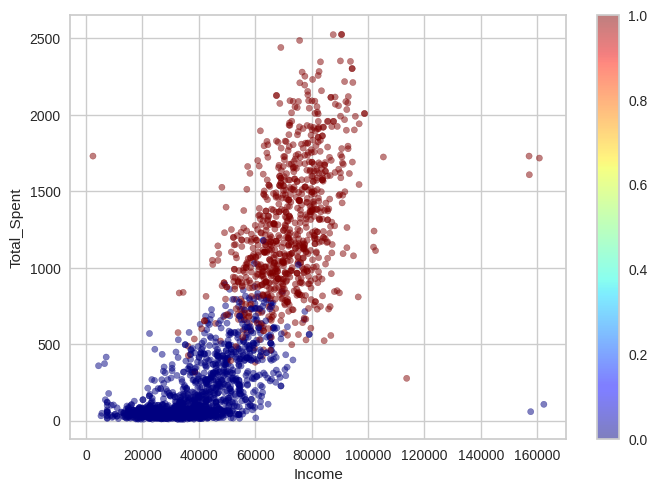

In [844]:
df_model.plot.scatter(x='Income', y='Total_Spent', c=model_kmeans_2_fitted.labels_, colormap='jet', alpha=0.5)

In [846]:
df_model_kmeans_2 = df_model.copy()
df_model_kmeans_2['label'] = model_kmeans_2_fitted.labels_
df_model_kmeans_2.head()

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,label
0,2,58138.0,0,0,663,58,57,0,635,88,546,172,88,88,1617,3,1,0.363636,0.454545,0.181818,7,22,73.500000,1,0.0,0.0,1.0,0.0,0.0,1
1,2,46344.0,1,1,113,38,60,0,11,1,6,2,1,6,27,2,0,0.250000,0.250000,0.500000,5,4,6.750000,3,0.0,0.0,1.0,0.0,0.0,0
2,2,71613.0,0,0,312,26,49,1,426,49,127,111,21,42,776,1,0,0.400000,0.100000,0.500000,4,20,38.800000,2,0.0,0.0,0.0,1.0,0.0,1
3,2,26646.0,1,0,139,26,30,1,11,4,20,10,3,5,53,2,0,0.333333,0.000000,0.666667,6,6,8.833333,3,0.0,0.0,0.0,1.0,0.0,0
4,4,58293.0,1,0,161,94,33,1,173,43,118,46,27,15,422,5,0,0.357143,0.214286,0.428571,5,14,30.142857,3,0.0,1.0,0.0,0.0,0.0,0


In [847]:
df_model_kmeans_2.label.value_counts()

0    1347
1     859
Name: label, dtype: int64

In [848]:
df_model_kmeans_2.groupby("label").mean()

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.409800,39265.841128,0.687454,0.570898,336.909428,48.649592,43.948775,0.663697,108.619896,7.077951,39.352635,10.172235,7.342242,23.124722,195.689681,2.549369,0.210839,0.357201,0.092963,0.549836,6.338530,8.113586,19.101001,2.922049,0.095768,0.400891,0.211581,0.262806,0.028953
1,2.538999,71847.307334,0.057043,0.406286,381.438882,49.550640,46.849825,0.619325,615.799767,56.696158,368.396973,80.991851,58.129220,76.844005,1256.857974,1.953434,0.825378,0.286670,0.278441,0.434890,3.685681,19.637951,66.482674,2.082654,0.115250,0.366705,0.222352,0.252619,0.043073


In [850]:
df_model_kmeans_2.groupby("label").median()

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.0,38590.0,1.0,1.0,331.0,49.0,43.0,1.0,37.0,3.0,21.0,4.0,3.0,13.0,94.0,2.0,0.0,0.352941,0.083333,0.545455,7.0,6.0,16.000000,3.0,0.0,0.0,0.0,0.0,0.0
1,2.0,71853.0,0.0,0.0,406.0,51.0,47.0,1.0,571.0,42.0,309.0,65.0,43.0,56.0,1188.0,1.0,0.0,0.277778,0.263158,0.444444,3.0,20.0,68.444444,2.0,0.0,0.0,0.0,0.0,0.0


In [849]:
df_model_kmeans_2.groupby("label").agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases,AvgTicket,NumPeopleHousehold,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2,7500.0,1,1,98,49,38,1,2,0,7,0,0,4,46,1,0,0.333333,0.000000,0.5,7,4,7.333333,3,0.0,0.0,0.0,0.0,0.0
1,2,63841.0,0,0,85,56,44,1,398,0,217,0,0,0,902,1,0,0.250000,0.333333,0.5,2,18,41.000000,2,0.0,0.0,0.0,0.0,0.0


We can take some conclusions from the mean and mode of the columns, such as:
* Income: People from group 1 have a larger income
* Kidhome and Teenhome: group 1 mostly has no kids, and they have less teens than group 0. Group 0 tends to have children.
* MntWines and MntMeatProducts: group 1 spends a lot more in wines and Meat compared to group 0
* Total_Spent: group 1 has spent a lot more in total
* NumDealsPurchases: group 1 has less number of deal purchases
* Accepted_Campaigns: although both groups don't accept many campaigns, group 0 is more likely
* Place to buy: group 1 has made more purchases, and prefers to buy in Store, followed by a tie in Catalog and Web Purchases. Group 0 has made less Purchases and it prefers to buy in Store and the Web, with few purchases through the Catalog. Group 0 also visits the web more.
* Marital Status: Both groups are mainly formed of people who are Married and Together.
* NumPeopleHousehold: group 0 is mostly composed of 3 people (probably because they are more likely to have children), while group 1 is most times composed of 2 people.

We can observe and confirm these differences in distributions between the both groups through the graphs below.

<ipython-input-858-ba817c79e866>:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_model_kmeans_2, x=column,  fill=True, hue="label", ax=ax[i, j])


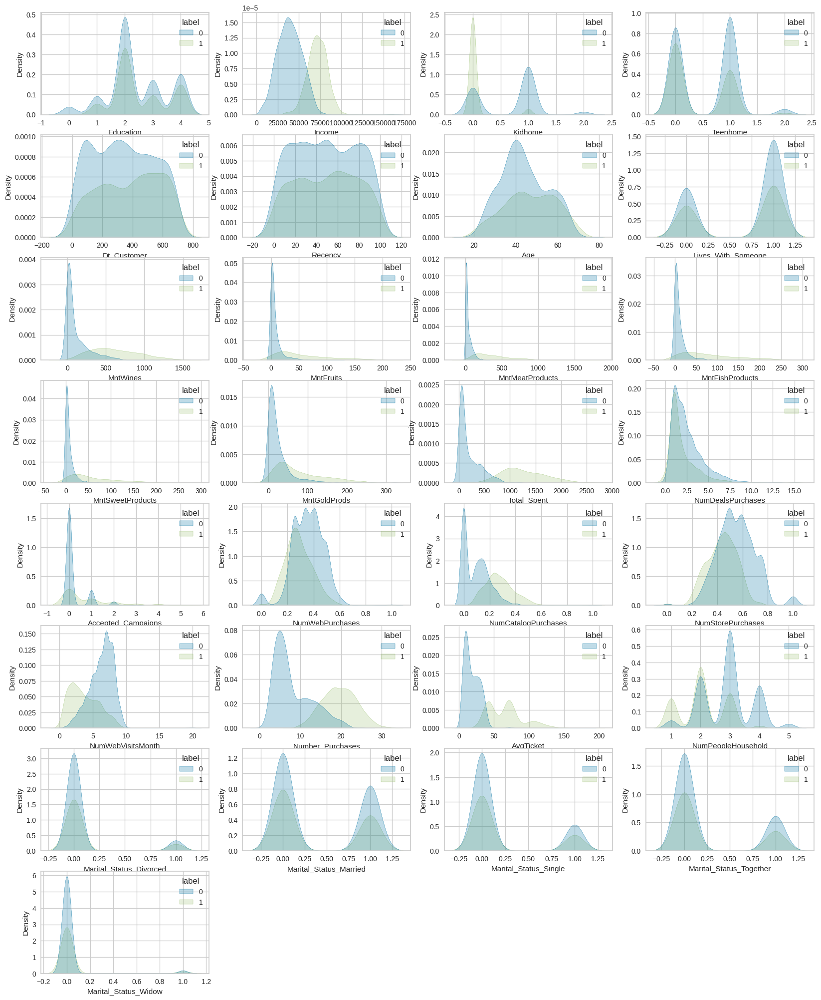

In [858]:
fig, ax = plt.subplots(8,4, figsize=(20, 25))
i = 0
j = 0

for column in df_model_kmeans_2.columns:
  sns.kdeplot(df_model_kmeans_2, x=column,  fill=True, hue="label", ax=ax[i, j])
  j += 1
  if j == 4:
      i += 1
      j = 0

fig.delaxes(ax[7,1])
fig.delaxes(ax[7,2])
fig.delaxes(ax[7,3])

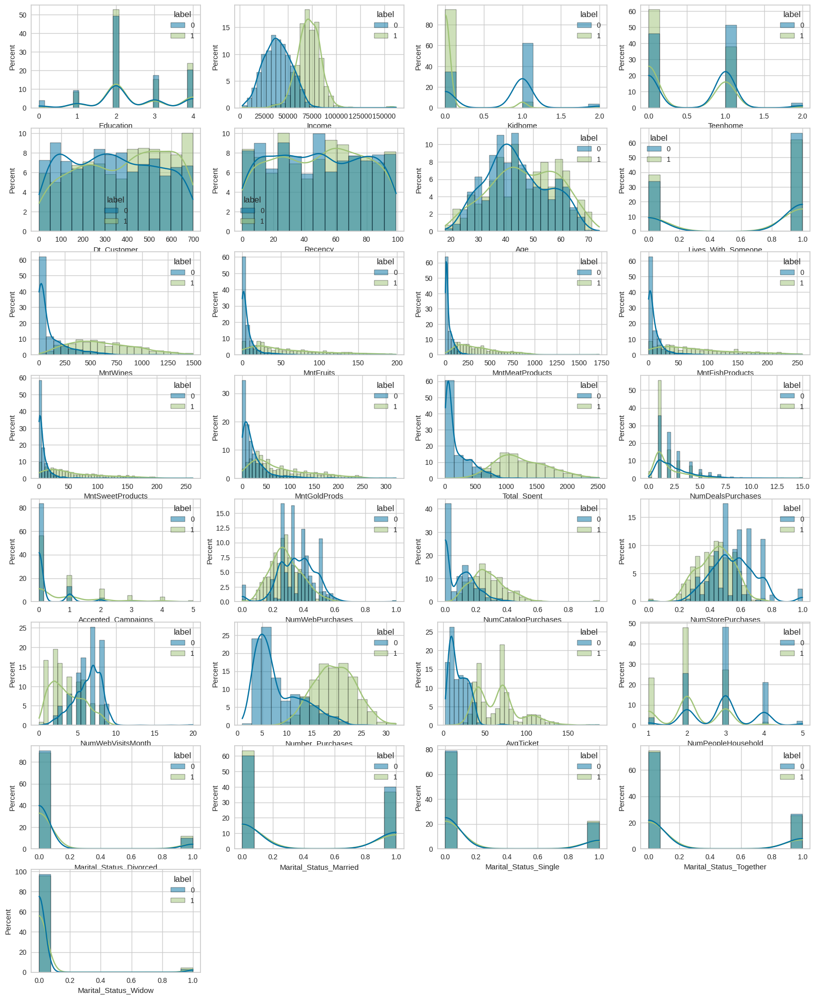

In [857]:
fig, ax = plt.subplots(8,4, figsize=(20, 25))
i = 0
j = 0

for column in df_model_kmeans_2.columns:
  sns.histplot(df_model_kmeans_2, x=column, stat='percent', kde=True, fill=True, hue="label", common_norm=False, multiple='layer', ax=ax[i, j])
  j += 1
  if j == 4:
      i += 1
      j = 0

fig.delaxes(ax[7,1])
fig.delaxes(ax[7,2])
fig.delaxes(ax[7,3])

Organizing the general characteristics for each group:

**Group 0**: they have a smaller income and a larger proportion of Kids and Teens in the family. Their spent is less than the other group in all categories, and overall. They also make more Deal Purchases than the other group They focus their purchases in the Store and the Web, and rarely buy from the Catalog.

**Group 1**: they have larger income and less kids/teens. They spend more in Meat and Wine Products (and the other categories) which lead them to be the group that spends more. They are also more likely to accept the campaigns. They mostly make their purchases using the Store, followed by a tie in Catalog and Web.

# What actions can we take from the information above?

- The **Catalog** should display products focused on the **preferences of People on the Cluster 1**, since it is rarely used by people on Cluster 0. That is, it can focus on **products like Wine and Meat**, and also products that are potentially **more expensive**. The Catalog is also a place where **Campaigns can happen**, since the people from cluster 1 will be able to check it out.
- The **Web** should focus on **Deals** and **Products for Kids**, since that is the profile we discovered for **people in Group 1**, that focus an average of 35% of their purchases in the Web, and being the group that visits the Web the most. This can potentially increase their spend!
